# Notebook for analysing all Stripe tracking / VR trials in one experiment folder

## (assumes use of FlyOver version 9.5 or higher)

In [60]:
import numpy as np
import pandas as pd
    
from os import listdir, mkdir, walk, getcwd
from os.path import isfile, sep
from sys import path, exit
from glob import glob
from scipy.interpolate import interp1d
from scipy import stats as sts
from scipy.optimize import curve_fit

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.patches as patches
from matplotlib import gridspec
import seaborn as sns

from Tkinter import Tk
from tkFileDialog import askdirectory, askopenfilename


# Set path to analysis code directory
codeDir = sep.join(getcwd().split(sep)[:-2])
path.insert(1, codeDir)

# import basic data processing function
from flyVR.utilities.loadSingleTrial import loadSingleVRLogfile
from flyVR.utilities.loadObjectCoords import loadObjectCoordIdentities

from flyVR.flyVRstripetracking.flyVRstripetracking_fourConditions_oneFlyAnalysis import processTrackingTrial

from trajectoryAnalysis.downsample import donwsampleFOData
from trajectoryAnalysis.periodicWorldAnalysis import collapseToMiniArena, collapseTwoObjGrid
from trajectoryAnalysis.circularStatsOnTrajectories import circmeanvec, fractional_polar_axes, RayleighTest

# import custom plotting functions
from plottingUtilities.basicPlotting import myAxisTheme, timeAxisTheme, niceScatterPlot, makeNestedPlotDirectory, _myAccentList
from plottingUtilities.flyTracePlots import plotPosInRange, plotFlyVRtimeStp, plotPolarTrace
from plottingUtilities.velocityDistributionPlots import plotVeloHistogram_fancy, velocitySummaryPlot
from plottingUtilities.objectInteractionPlots import plotHeadingComparison, lineHistogram, plotWalkingVelocityDistr,\
                                                    plotHeadingDistFromTimeseries
    

import seaborn as sns
sns.set_style('ticks')

%matplotlib inline 

# Choose files to analyse ..............................................................................................

baseDir = '/Volumes/jayaramanlab/Hannah/Projects/FlyVR/1_Experiments/singleObj/FlyOver095_lowContrast/stripetracking/'

root = Tk()
# prevents root window from appearing
root.withdraw()
root.update()

# choose experiment folder
dataDir = askdirectory(initialdir=baseDir,
                       title='Select experiment directory (containing directories for multiple flies)') + sep
root.update()
root.destroy()
expDirs = sorted(walk(dataDir).next()[1])

analysisDir = sep.join(dataDir.split(sep)[:-2]) + sep + 'analysis' + sep

try:
    expDirs.remove('virtualWorld')
except:
    print('You selected an invalid data directory.\n' +
          'Expected folder structure of the selected path is some/path/to/experimentName/flyGender/rawData/')
    exit(1)

print('\n Analysing the following folders:\n')
print(expDirs)

rerunbasicanalysis = raw_input('Would you like to (re-)run the basic analysis on each file \n'
                               'instead of loading previously saved data? (y, n)\n')


 Analysing the following folders:

['m01', 'm02', 'm03', 'm04', 'm05', 'm06', 'm07', 'm08', 'm09', 'm10', 'm11', 'm12', 'm13', 'm14', 'm15', 'm16', 'm17', 'm18', 'm19', 'm20', 'm21', 'm22', 'm23', 'm24', 'm25']
Would you like to (re-)run the basic analysis on each file 
instead of loading previously saved data? (y, n)
n


### Compose mutli-fly data into dataframe

In [61]:
# generate fly color map
numFlies = len(expDirs)
cNorm  = colors.Normalize(vmin=0, vmax=numFlies)

mycmap = colors.LinearSegmentedColormap.from_list('myAccent',_myAccentList, N=256, gamma=1.0)
flyCMap = plt.cm.ScalarMappable(norm=cNorm,cmap=mycmap)

expDir = dataDir + expDirs[0] + sep
FODataFiles = [filepath.split(sep)[-1] for filepath in glob(expDir + '*.txt')]

In [62]:
keylist = ['gamma','gammaFull','headingAngle','rotVelo','time',
           'transVelo','xPos','xPosInMiniarena','yPos','yPosInMiniarena','moving']

keylistLong = ['flyID','trial','trialtype','sceneName'] + keylist
FOAllFlies_df = pd.DataFrame(data=np.zeros((0,len(keylistLong))), columns=keylistLong)

In [63]:
genotype = dataDir.split('/')[-5]
genotype

'WTBxpBDP-Gal4-highT'

In [64]:
vTransTH = 2 #mm/s

# Go through directories of experiments with different flies ...............................................
for currExpDir in expDirs:

    expDir = dataDir + currExpDir + sep
    print('\n Analysing the following folder:\n')
    print(expDir)

    FODataFiles = [filepath.split(sep)[-1] for filepath in glob(expDir + '*.txt')]
    FODataFiles = sorted(FODataFiles)

    print('\n Analysing the following log files:\n')
    print(FODataFiles)

    # Run single trial analysis on each file in folder .....................................................
    for fileToAnalyse in FODataFiles:

        flyID = currExpDir
        trial = FODataFiles.index(fileToAnalyse) + 1
        sceneName = fileToAnalyse.split('_')[1]
        
        if rerunbasicanalysis == 'y':
            #Load and process raw data
            titleString = 'fly '+flyID+' ('+genotype+')'+' in '+sceneName+' world'
            processTrackingTrial(expDir, fileToAnalyse, '/'.join(dataDir.split('/')[:-2])+'/', titleString)
            FODatLoad = np.load(expDir + fileToAnalyse[:-3] + 'npy')[()]
            print('Ran analysis, now loading saved *.npy file.')
        else:
            # just load existing npy file with processed data
            print('Loading saved *.npy file.')
            FODatLoad = np.load(expDir + fileToAnalyse[:-3] + 'npy')[()]
    
        if ('Stripe' in fileToAnalyse or 'stripe' in fileToAnalyse):
            trialtype = 'stripe'
        else:
            trialtype = 'plane'

        if ('inverted' in fileToAnalyse or 'Inverted' in fileToAnalyse):
            sceneName = 'inverted'+sceneName

        # add to data frame
        FODatLoad_df = pd.DataFrame.from_dict(FODatLoad,orient='columns')
        FODatLoad_df.insert(0, 'flyID', flyID)
        FODatLoad_df.insert(1, 'trial', trial)
        FODatLoad_df.insert(2, 'trialtype', trialtype)
        FODatLoad_df.insert(3, 'sceneName', sceneName)
    
        FOAllFlies_df = FOAllFlies_df.append(FODatLoad_df)


 Analysing the following folder:

/Volumes/jayaramanlab/Hannah/Projects/FlyVR/1_Experiments/singleObj/FlyOver095_lowContrast/stripetracking/WTBxpBDP-Gal4-highT/fourConditions/male/rawData/m01/

 Analysing the following log files:

['singleObjectForest_1cm4cmCone_12cmHex_WTBxpDBP-Gal4_m01_8-9d_out_170123160926.txt', 'singleObjectForest_1cm4cmCone_12cmHex_inverted_WTBxpDBP-Gal4_m01_8-9d_out_170123155617.txt', 'stripe20deg_BlackOnWhite_WTBxpBDP-Gal4_m01_8-9d_out_170123154502.txt', 'stripe20deg_WhiteOnBlack_WTBxpBDP-Gal4_m01_8-9d_out_170123162512.txt']
Loading saved *.npy file.
Loading saved *.npy file.
Loading saved *.npy file.
Loading saved *.npy file.

 Analysing the following folder:

/Volumes/jayaramanlab/Hannah/Projects/FlyVR/1_Experiments/singleObj/FlyOver095_lowContrast/stripetracking/WTBxpBDP-Gal4-highT/fourConditions/male/rawData/m02/

 Analysing the following log files:

['singleObjectForest_1cm4cmCone_12cmHex_WTBxpDBP-Gal4_m02_8-9d_out_170123182927.txt', 'singleObjectForest_1c

Loading saved *.npy file.
Loading saved *.npy file.
Loading saved *.npy file.

 Analysing the following folder:

/Volumes/jayaramanlab/Hannah/Projects/FlyVR/1_Experiments/singleObj/FlyOver095_lowContrast/stripetracking/WTBxpBDP-Gal4-highT/fourConditions/male/rawData/m14/

 Analysing the following log files:

['singleObjectForest_1cm4cmCone_12cmHex_WTBxpDBP-Gal4_m14_8d_out_170214181313.txt', 'singleObjectForest_1cm4cmCone_12cmHex_inverted_WTBxpDBP-Gal4_m14_8d_out_170214175023.txt', 'stripe20deg_BlackOnWhite_WTBxpBDP-Gal4_m14_8d_out_170214173420.txt', 'stripe20deg_WhiteOnBlack_WTBxpBDP-Gal4_m14_8d_out_170214180207.txt']
Loading saved *.npy file.
Loading saved *.npy file.
Loading saved *.npy file.
Loading saved *.npy file.

 Analysing the following folder:

/Volumes/jayaramanlab/Hannah/Projects/FlyVR/1_Experiments/singleObj/FlyOver095_lowContrast/stripetracking/WTBxpBDP-Gal4-highT/fourConditions/male/rawData/m15/

 Analysing the following log files:

['singleObjectForest_1cm4cmCone_12cmHe

In [65]:
FOAllFlies_df =FOAllFlies_df[keylistLong]

FOAllFlies_df['flyID'] = FOAllFlies_df['flyID'].astype('category')
FOAllFlies_df['trial'] = FOAllFlies_df['trial'].astype('category')
FOAllFlies_df['trialtype'] = FOAllFlies_df['trialtype'].astype('category')

FOAllFlies_df 

,flyID,trial,trialtype,sceneName,gamma,gammaFull,headingAngle,rotVelo,time,transVelo,xPos,xPosInMiniarena,yPos,yPosInMiniarena,moving
0,m01,1.0,plane,1cm4cmCone,NaN,NaN,-0.000004,-1.265835,0.000000,1.019462,60.622000,NaN,35.000000,NaN,0.0
1,m01,1.0,plane,1cm4cmCone,NaN,NaN,-0.063304,-1.107775,0.050007,2.363040,60.619010,NaN,34.949108,NaN,1.0
2,m01,1.0,plane,1cm4cmCone,NaN,NaN,-0.118700,0.158245,0.100013,2.367252,60.685396,NaN,35.046865,NaN,1.0
3,m01,1.0,plane,1cm4cmCone,NaN,NaN,-0.110787,0.474736,0.150020,5.536594,60.751600,NaN,35.145000,NaN,1.0
4,m01,1.0,plane,1cm4cmCone,NaN,NaN,-0.087047,0.237372,0.200027,8.311284,61.027056,NaN,35.172913,NaN,1.0
5,m01,1.0,plane,1cm4cmCone,NaN,NaN,-0.075177,1.345086,0.250033,7.252138,61.323404,NaN,35.464319,NaN,1.0
6,m01,1.0,plane,1cm4cmCone,NaN,NaN,-0.007913,1.819827,0.300040,8.667304,61.654092,NaN,35.613195,NaN,1.0
7,m01,1.0,plane,1cm4cmCone,NaN,NaN,0.083090,1.819823,0.350046,8.168875,62.020086,NaN,35.845366,NaN,1.0
8,m01,1.0,plane,1cm4cmCone,NaN,NaN,0.174093,0.712101,0.400053,4.476958,62.427158,NaN,35.879474,NaN,1.0
9,m01,1.0,plane,1cm4cmCone,NaN,NaN,0.209703,-0.158245,0.450060,3.764867,62.650908,NaN,35.871920,NaN,1.0


In [66]:
keyind_xPos = keylistLong.index('xPosInMiniarena')
keyind_yPos = keylistLong.index('yPosInMiniarena')
keyind_mov = keylistLong.index('moving')
keyind_gam = keylistLong.index('gamma')
keyind_gamful = keylistLong.index('gammaFull')
keyind_fly = keylistLong.index('flyID')
keyind_vT = keylistLong.index('transVelo')
keyind_ang = keylistLong.index('headingAngle')
keyind_t = keylistLong.index('time')
keyind_vR = keylistLong.index('rotVelo')

flyIDallarray = np.asarray(FOAllFlies_df.iloc[:,keyind_fly:keyind_fly+1]).squeeze()
flyIDs = sorted(list(set(flyIDallarray.tolist())))

In [67]:
genotype = fileToAnalyse.split('_')[-5]
#genotype = fileToAnalyse.split('_')[4]

genotypeSex = genotype+fileToAnalyse.split('_')[-4][0]
#genotypeSex = genotype+fileToAnalyse.split('_')[-3][0]

genotypeSex

'WTBxpBDP-Gal4m'

### Experimental conditions

In [68]:
sceneNames = list(set(FOAllFlies_df['sceneName'].values.tolist()))

In [69]:
sceneNames

['1cm4cmCone', 'inverted1cm4cmCone', 'BlackOnWhite', 'WhiteOnBlack']

### Walking velocity distributions

In [70]:
histRangeVT = (vTransTH, 30)
histRangeVR = (-5,5)
numBins = 30

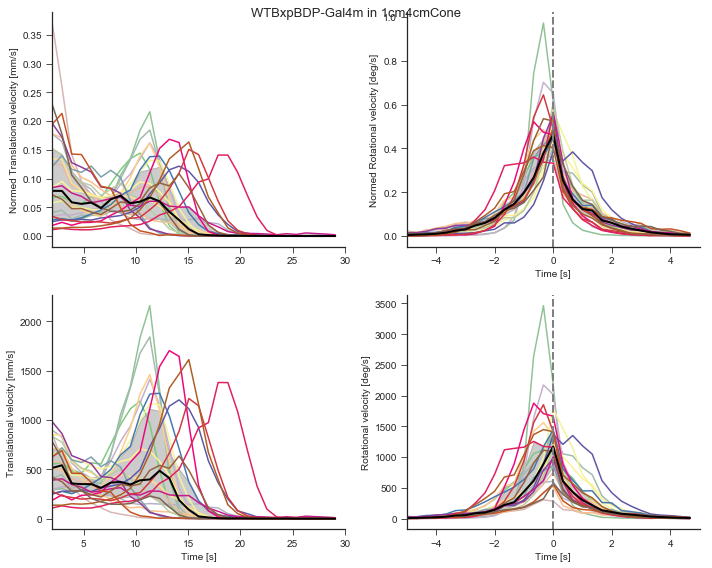

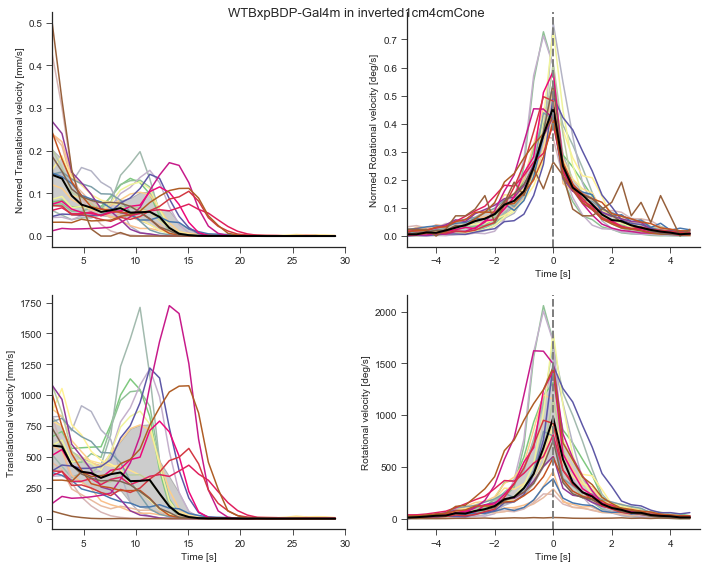

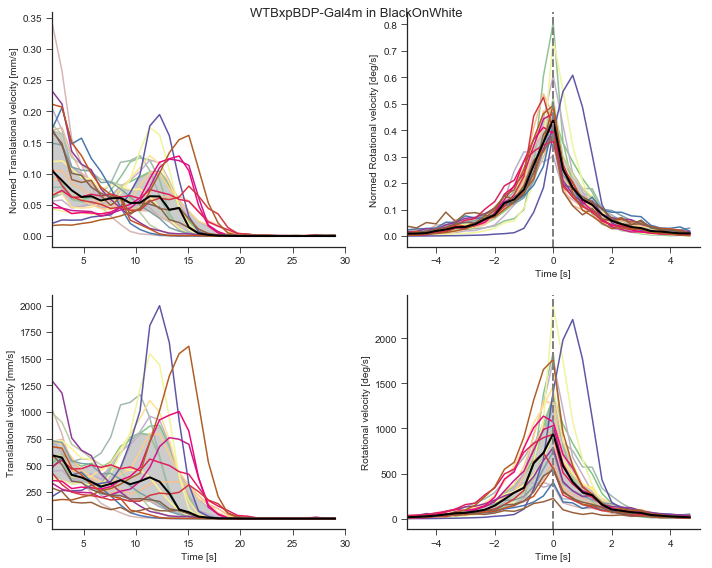

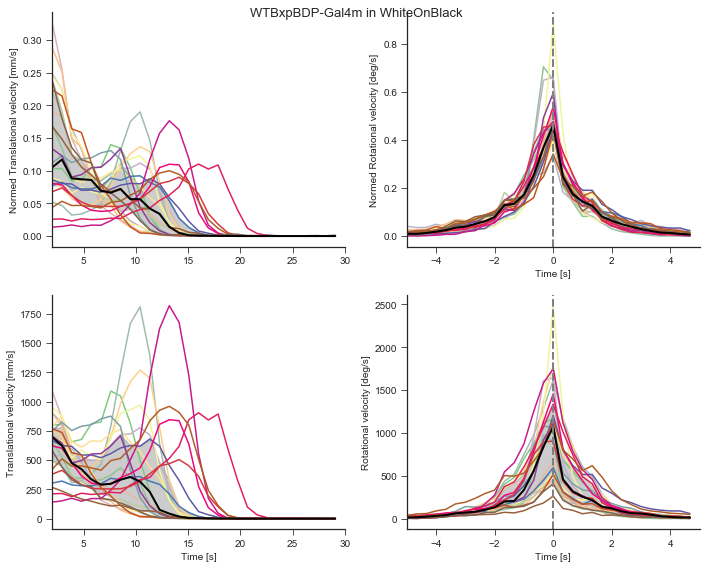

In [71]:
for scene, scenename in enumerate(sceneNames):
    scene_df = FOAllFlies_df.query('sceneName == "' + scenename + '"')
    titleString = genotypeSex+' in '+ scenename
    
    walkingFig = plotWalkingVelocityDistr(scene_df, flyIDs, keyind_mov, keyind_vT, keyind_vR, flyCMap,
                                 histRangeVT, histRangeVR,numBins, numFlies)
    walkingFig.suptitle(titleString, fontsize=13)
    walkingFig.tight_layout()

    walkingFig.savefig(analysisDir + sep + 'velocityTraces' + sep + genotypeSex + '_walingVelocities_'+scenename+\
                       '_medianIQR_n'+str(numFlies)+'.pdf', format = 'pdf')

### Heading angle distribution (if stripe)

In [72]:
try:
    mkdir(analysisDir + sep + 'heading' + sep)
except OSError:
    print('Analysis directory already exists.')

Analysis directory already exists.


1cm4cmCone
inverted1cm4cmCone
fly m06 not moving
17.3333333333
fly m07 not moving
16.8416666667
fly m24 not moving
1.09166666667
fly m06 not moving
17.3333333333
fly m07 not moving
16.8416666667
fly m24 not moving
1.09166666667
BlackOnWhite
fly m24 not moving
15.2833333333
fly m24 not moving
15.2833333333
WhiteOnBlack
fly m24 not moving
14.2
fly m24 not moving
14.2


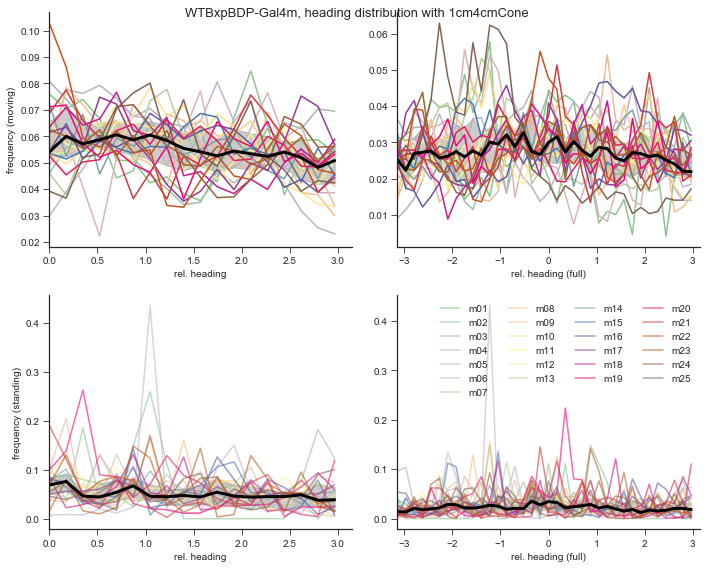

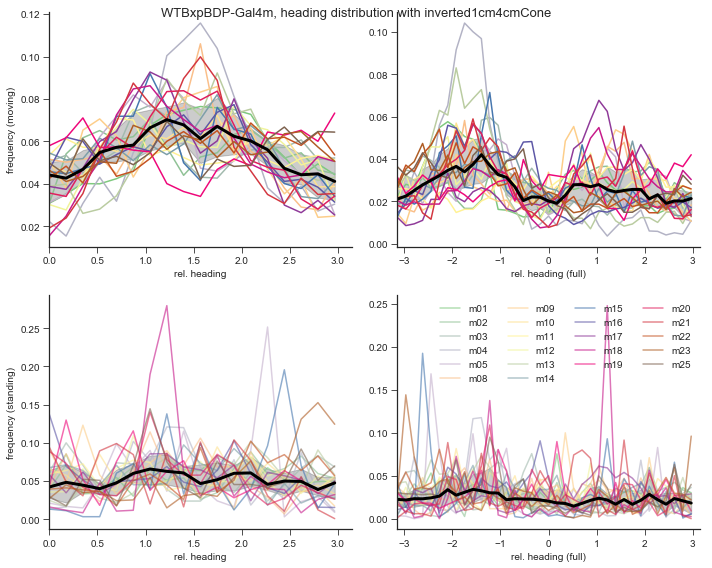

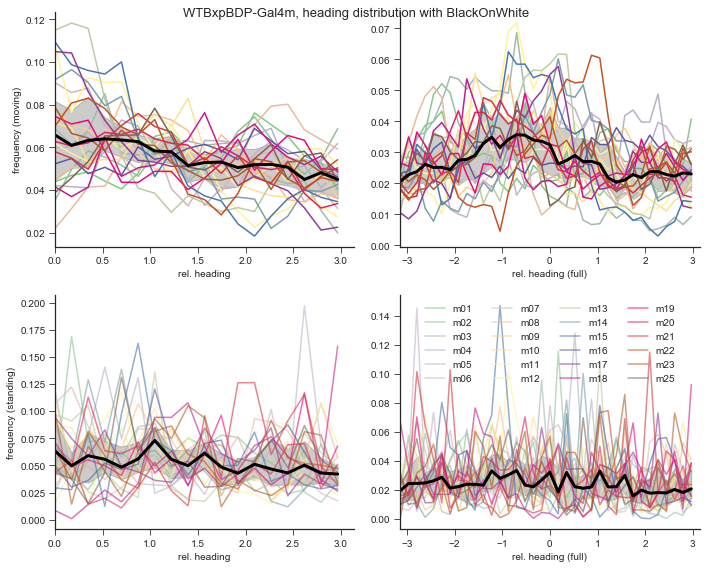

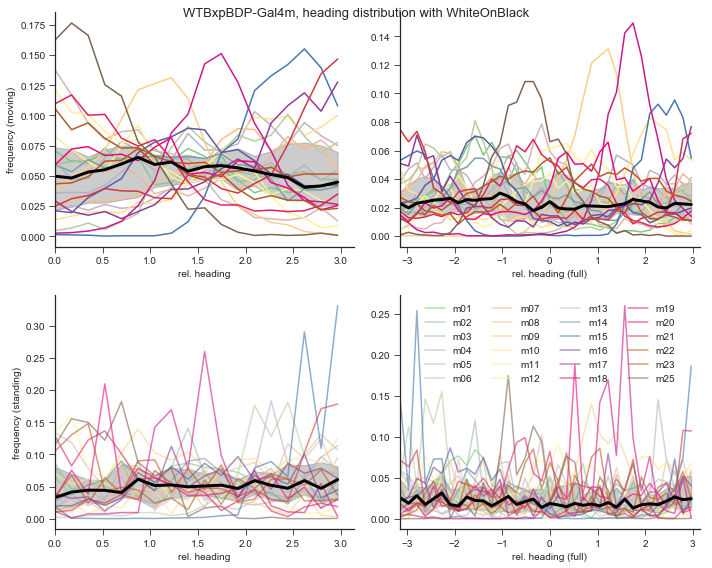

In [73]:
for scene in range(len(sceneNames)):

    scenename = sceneNames[scene]
    print(scenename)
    densityFlag = True
    titleString = genotypeSex+', heading distribution with '+ scenename

    headingfig, nhead_fullGamma = plotHeadingComparison(FOAllFlies_df, flyIDs, scenename,titleString,
                                       keyind_gam, keyind_gamful, keyind_mov, flyCMap, densityFlag, True)

    headingfig.savefig(analysisDir + sep + 'heading' + sep + genotypeSex + '_headingDistribution_'+scenename+'_medianIQR_n'+str(numFlies)+'.pdf', format = 'pdf')

1cm4cmCone
inverted1cm4cmCone
fly m06 not moving
17.3333333333
fly m07 not moving
16.8416666667
fly m24 not moving
1.09166666667
fly m06 not moving
17.3333333333
fly m07 not moving
16.8416666667
fly m24 not moving
1.09166666667
BlackOnWhite
fly m24 not moving
15.2833333333
fly m24 not moving
15.2833333333
WhiteOnBlack
fly m24 not moving
14.2
fly m24 not moving
14.2


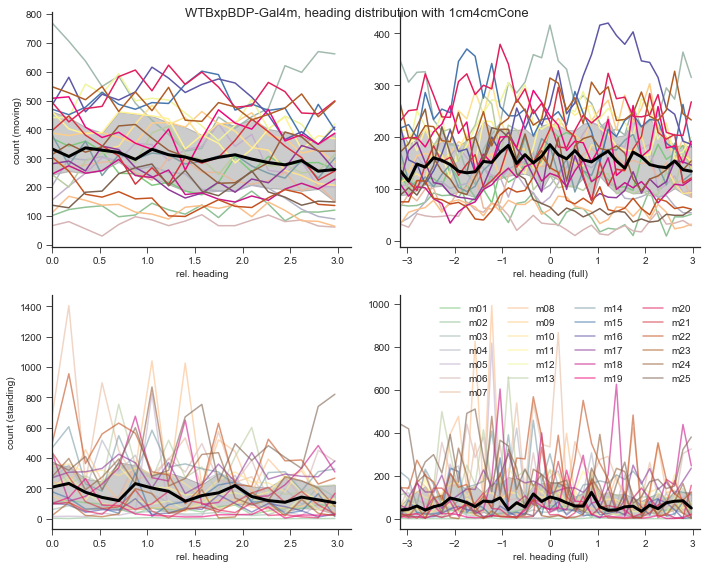

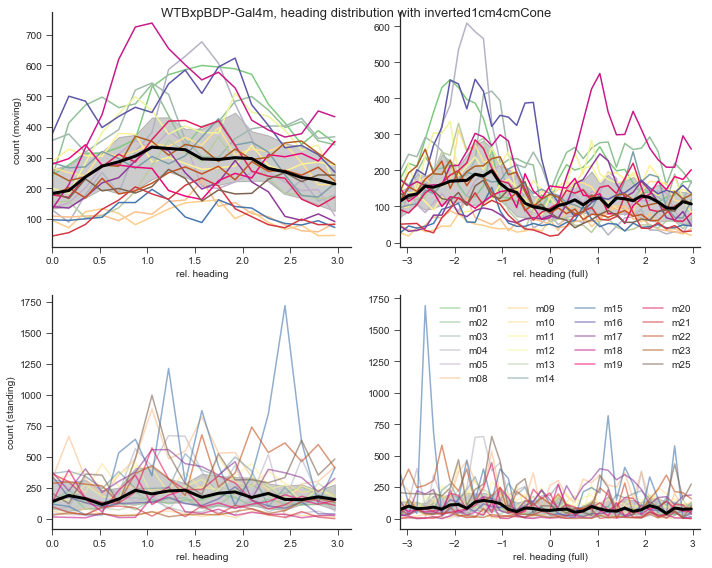

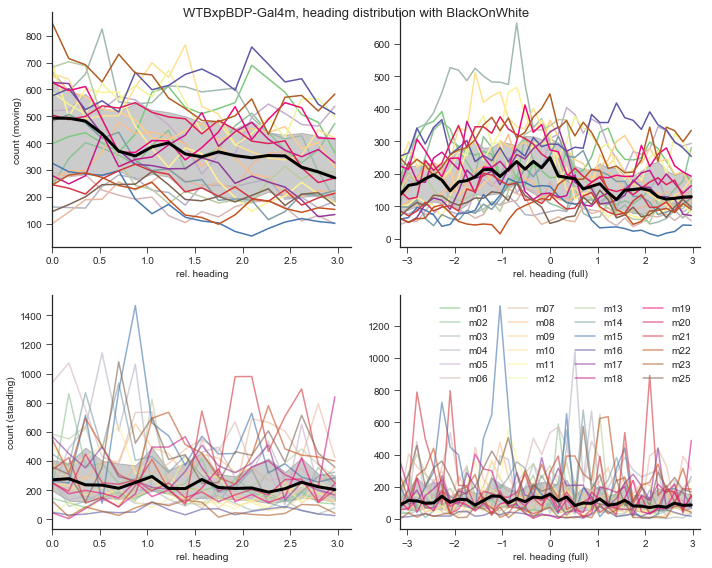

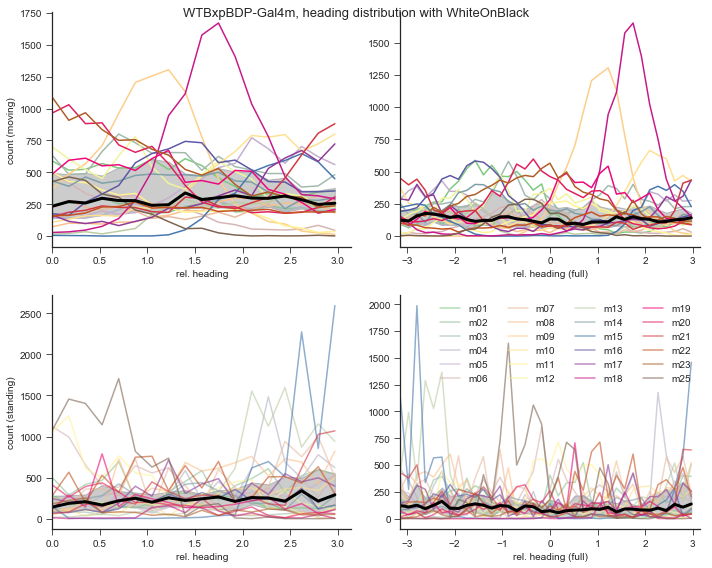

In [74]:
for scene in range(len(sceneNames)):
    headingfig = plt.figure(figsize=(10,8))

    scenename = sceneNames[scene]
    print(scenename)
    
    densityFlag = False
    titleString = genotypeSex+', heading distribution with '+ scenename

    headingfig, nhead_fullGamma = plotHeadingComparison(FOAllFlies_df, flyIDs, scenename,titleString,
                                       keyind_gam, keyind_gamful, keyind_mov, flyCMap, densityFlag, True)

    headingfig.savefig(analysisDir + sep + 'heading' + sep + genotypeSex + '_headingCounts_'+scenename+'_medianIQR_n'+str(numFlies)+'.pdf', format = 'pdf')

## Comparison between relative heading and absolute heading in 2D worlds (they are the same in 1D)

In [75]:
def plot2DHeadingComparison(sceneName,titleString,densityFlag,plotIQR):
    legendlist = []
    fullBins = 36
    histRange = (-np.pi, np.pi)

    nhead_angle = np.nan*np.ones((numFlies,fullBins))
    nhead_gamma = np.nan*np.ones((numFlies,fullBins))
    
    gammaPlt = headingfig.add_subplot(121)
    
    for fly in range(numFlies):
        querystring = '(sceneName=="' + sceneName + '") & (flyID =="' + flyIDs[fly] +  '")'

        gammaFull = FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1].squeeze()
        angle = FOAllFlies_df.query(querystring).iloc[:,keyind_ang:keyind_ang+1].squeeze()

        moving = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze()
        
        if sum(moving)<=0.2*len(moving):
            print('fly '+str(flyIDs[fly])+' not moving: '+  str(100.0*sum(moving)/max(1,len(moving))))
            continue
            
        legendlist.append(flyIDs[fly])
        
        if densityFlag:
            ylab = 'frequency (when moving)'
        else:
            ylab = 'count (when moving)'
        
        # rel. heading
        gammaPlt, normgam, fulledges = plotHeadingDistFromTimeseries(gammaPlt, gammaFull[moving > 0], densityFlag,
                                                                     histRange, fullBins, flyCMap.to_rgba(fly),
                                                                     'rel. heading', ylab, 1)
        nhead_gamma[fly, :] = normgam

        # abs. heading
        anglePlt = headingfig.add_subplot(122)
        
        anglePlt, normang, fulledges = plotHeadingDistFromTimeseries(anglePlt, angle[moving > 0], densityFlag, 
                                                                     histRange, fullBins, flyCMap.to_rgba(fly), 
                                                                     'abs. heading', ylab, 1)

        nhead_angle[fly,:] = normang

    headingfig.suptitle(titleString,fontsize=13)
    anglePlt.legend(legendlist)
    headingfig.tight_layout()
    
    gammaPlt.plot(fulledges,np.nanmedian(nhead_gamma[:,:],0),color='k',linewidth=3)
    anglePlt.plot(fulledges,np.nanmedian(nhead_angle[:,:],0),color='k',linewidth=3)
    
    if(plotIQR):
        [var1,var2] = np.nanpercentile(nhead_gamma[:,:],[25,75],axis=0)
        gammaPlt.fill_between(fulledges, var1, var2, color='k', alpha=0.2)
        
        [var1,var2] = np.nanpercentile(nhead_angle[:,:],[25,75],axis=0)
        anglePlt.fill_between(fulledges, var1, var2, color='k', alpha=0.2)

    return headingfig

1cm4cmCone

inverted1cm4cmCone

fly m06 not moving: 17.3333333333
fly m07 not moving: 16.8416666667
fly m24 not moving: 1.09166666667


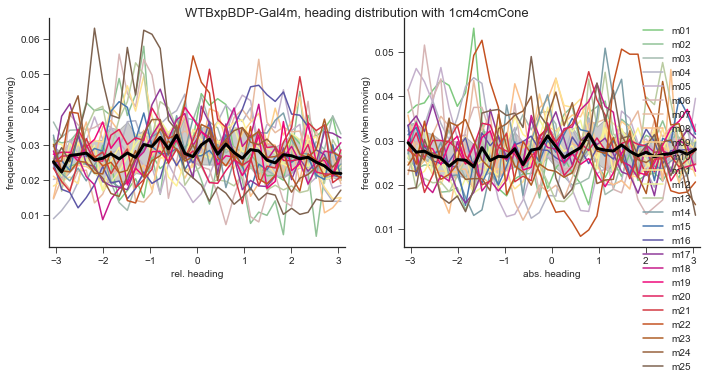

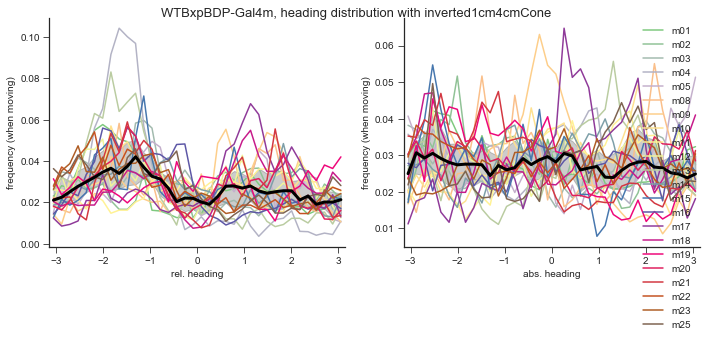

In [76]:
for scene in [0,1]:
    headingfig = plt.figure(figsize=(10,4))

    scenename = sceneNames[scene]
    print(scenename+'\n')
    densityFlag = True
    titleString = genotypeSex+', heading distribution with '+ scenename

    headingfig = plot2DHeadingComparison(scenename,titleString,densityFlag,True)

    headingfig.savefig(analysisDir + sep + 'heading' + sep + genotypeSex + '_rel-abs-heading_'+scenename+'_medianIQR_n'+str(numFlies)+'.pdf', format = 'pdf')

## Compute circular statistics on heading distribution

In [77]:
angleLow = -np.pi
angleHigh = np.pi

headingPVA = np.nan*np.ones((len(sceneNames),numFlies,2))
anglePVA = np.nan*np.ones((len(sceneNames),numFlies,2))
fliesNotWalking = np.zeros((len(sceneNames)))

from scipy.stats import circmean as circmean

for scene in range(len(sceneNames)):
    scenename = sceneNames[scene]
    print('\n'+scenename+'\n')
    
    for fly in range(numFlies):

        querystring = '(sceneName=="' + scenename + '") & (flyID =="' + flyIDs[fly] +  '")'
        moving = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze().astype('int').values

        perFlyG = FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1].squeeze().astype('float').values
        perFlyA = FOAllFlies_df.query(querystring).iloc[:,keyind_ang:keyind_ang+1].squeeze().astype('float').values

        if sum(moving)<=0.2*len(moving):
            print('fly '+str(flyIDs[fly])+' not moving: '+str(100.0*sum(moving)/max(1,len(moving))))
            fliesNotWalking[scene] += 1
            
            continue
        gamFul = perFlyG[moving>0]
        meandir, meanlen = circmeanvec(gamFul[~np.isnan(gamFul)],np.ones(len(gamFul[~np.isnan(gamFul)])), high=angleHigh, low=angleLow)

        headingPVA[scene,fly,0] = meandir
        headingPVA[scene,fly,1] = meanlen
        
        angle = perFlyA[moving>0]
        meandir, meanlen = circmeanvec(angle[~np.isnan(angle)],np.ones(len(angle[~np.isnan(angle)])), high=angleHigh, low=angleLow)

        anglePVA[scene,fly,0] = meandir
        anglePVA[scene,fly,1] = meanlen
        
try:
    mkdir(analysisDir + sep + 'circStats' + sep)
except OSError:
    print('Analysis directory already exists.')
        
np.savetxt(analysisDir + 'circStats/'  + genotype + '_headingPVA_dir_'+scenename+'_n'+ str(numFlies) +'.csv',
           headingPVA[:,:,0], delimiter=',')
np.savetxt(analysisDir + 'circStats/'  + genotype + '_headingPVA_len_'+scenename+'_n'+ str(numFlies) +'.csv',
           headingPVA[:,:,1], delimiter=',')
np.savetxt(analysisDir + 'circStats/'  + genotype + '_anglePVA_dir_'+scenename+'_n'+ str(numFlies) +'.csv',
           anglePVA[:,:,0], delimiter=',')
np.savetxt(analysisDir + 'circStats/'  + genotype + '_anglePVA_len_'+scenename+'_n'+ str(numFlies) +'.csv',
           anglePVA[:,:,1], delimiter=',')


1cm4cmCone


inverted1cm4cmCone

fly m06 not moving: 17.3333333333
fly m07 not moving: 16.8416666667
fly m24 not moving: 1.09166666667

BlackOnWhite

fly m24 not moving: 15.2833333333

WhiteOnBlack

fly m24 not moving: 14.2
Analysis directory already exists.


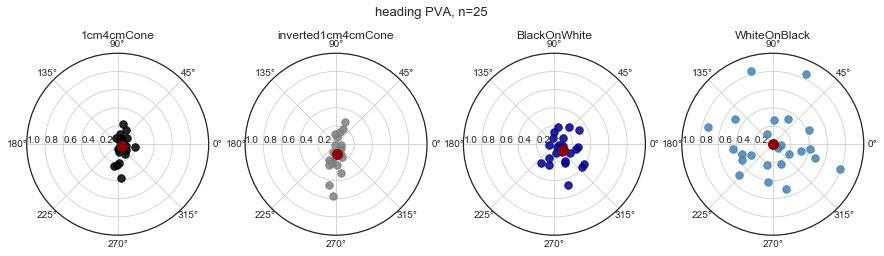

In [78]:
trialCol = ['black','grey','darkblue','steelblue']

PVAFig = plt.figure(figsize=(15,4))

for scene in range(len(sceneNames)):
    scenename = sceneNames[scene]    

    ax = PVAFig.add_subplot(1,len(sceneNames),scene+1,projection='polar')
    ax.plot(headingPVA[scene,:,0],headingPVA[scene,:,1],'.',markersize=15,color=trialCol[scene],alpha=0.85)
    meandir, meanlen = circmeanvec(headingPVA[scene,~np.isnan(headingPVA[scene,:,0]),0],\
                                   headingPVA[scene,~np.isnan(headingPVA[scene,:,0]),1],\
                                   high=angleHigh, low=angleLow)
    ax.plot(meandir,meanlen,'o', color='darkred',alpha=1, markersize=10)
    ax.set_rlim(0,1)
    ax.set_rlabel_position(180)
    ax.set_title(scenename)

PVAFig.suptitle('heading PVA, n='+str(numFlies),fontsize=13)
PVAFig.savefig(analysisDir + 'circStats/'  + genotype
                + '_headingPVA_n'+ str(numFlies) +'.pdf', format='pdf') 

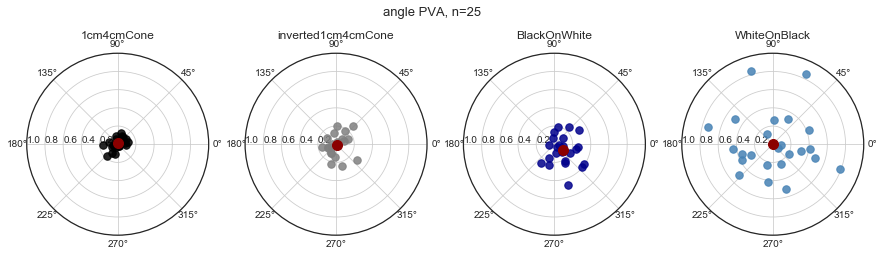

In [79]:
PVAFig = plt.figure(figsize=(15,4))

for scene in range(len(sceneNames)):
    scenename = sceneNames[scene]    

    ax = PVAFig.add_subplot(1,len(sceneNames),scene+1,projection='polar')
    ax.plot(anglePVA[scene,:,0],anglePVA[scene,:,1],'.',markersize=15,color=trialCol[scene],alpha=0.85)
    meandir, meanlen = circmeanvec(anglePVA[scene,~np.isnan(anglePVA[scene,:,0]),0],\
                                   anglePVA[scene,~np.isnan(anglePVA[scene,:,0]),1],\
                                   high=angleHigh, low=angleLow)
    ax.plot(meandir,meanlen,'o', color='darkred',alpha=1, markersize=10)
    ax.set_rlim(0,1)
    ax.set_rlabel_position(180)
    ax.set_title(scenename)

PVAFig.suptitle('angle PVA, n='+str(numFlies),fontsize=13)
PVAFig.savefig(analysisDir + 'circStats/'  + genotype
                + '_anglePVA_n'+ str(numFlies) +'.pdf', format='pdf') 

## Fit von Mises distribution

In [80]:
def vMFunc(x, mu, kappa):
    return np.exp(kappa * np.cos(x-mu)) / (2*np.pi*np.i0(kappa))

def vMbiModFunc(x, mu1, mu2, kappa):
    return ( (np.exp(kappa * np.cos(x-mu1)) / (2*np.pi*np.i0(kappa))) + (np.exp(kappa * np.cos(x-mu2)) / (2*np.pi*np.i0(kappa))) )/2

In [81]:
def plotOneTrialHeading(ax1, ax2, gammaful, time, meandir, meanlen):
    ax1.plot(time, gammaful)
    ax1.set_ylim(angleLow, angleHigh)
    ax1.set_xlim(0,600)
    myAxisTheme(ax1)
    
    ax2.plot(meandir, meanlen,'.',markersize=15,color='steelblue',alpha=0.85)
    ax2.set_rlim(0,0.8)
    ax2.set_rlabel_position(180)
    ax2.set_title('heading PVA, ' + sceneName + ', n='+str(numFlies))

In [82]:
#Selection criteria:
kappaTH = 0.5

### Fit unimodal von Mises

fly m06 not moving: 17.3333333333
fly m07 not moving: 16.8416666667
fly m24 not moving: 1.09166666667
fly m24 not moving: 15.2833333333
fly m24 not moving: 14.2


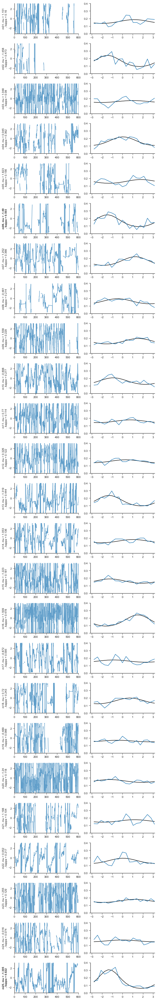

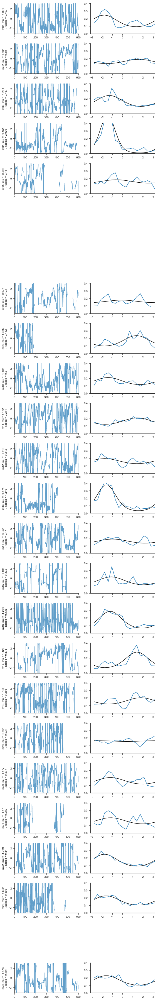

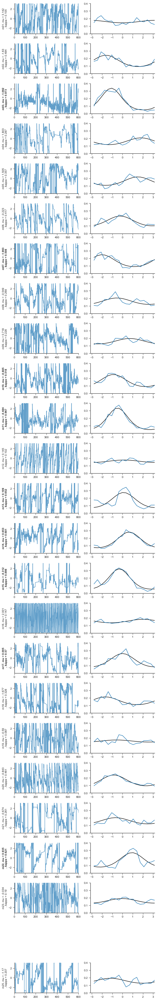

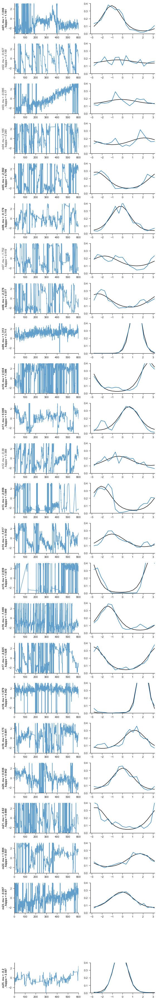

In [83]:
angleLow = -np.pi
angleHigh = np.pi

#bins size
binwidth = 20 #deg
numFlies = len(flyIDs)
vmfits = np.nan*np.ones((len(sceneNames),5,numFlies))

for scene in range(len(sceneNames)):
    sceneName = sceneNames[scene]
    fitFig = plt.figure(figsize=(8,2*numFlies))
    
    for fly in range(numFlies):
        querystring = '(sceneName=="' + sceneName + '") & (flyID =="' + flyIDs[fly] +  '")'
        moving = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze().astype('int').values

        perFlyG = FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1].squeeze().astype('float').values
        perFlyT = FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1].squeeze().astype('float').values

        if sum(moving)<=0.2*len(moving):
            print('fly '+str(flyIDs[fly])+' not moving: '+str(100.0*sum(moving)/max(1,len(moving))))

            continue

        gamFul = perFlyG[moving>0]
        time = perFlyT[moving>0]
        
        bins = np.linspace(angleLow,angleHigh, 360/binwidth + 1)
        x = bins[:-1] + np.mean(np.diff(bins))
        [n,edg] = np.histogram(gamFul,bins=(360/binwidth), range=(angleLow,angleHigh), normed=True)
        meandir_freq, meanlen_freq = circmeanvec(n,np.ones(len(n)), high=angleHigh, low=angleLow)

        popt, pcov = curve_fit(vMFunc, x, n, p0=[meandir_freq, meanlen_freq], bounds=([-np.pi, 0], [np.pi, np.inf]))
        mu = popt[0]
        kappa = popt[1]
        yhat = vMFunc(x,mu,kappa)

        #compute kolmogorov-smirnov statistic as measure of goodness of fit
        [ks, p] = sts.ks_2samp(n, yhat)

        #compute squared difference from fit
        sqd = np.sum(np.square(n-yhat))

        vmfits[scene,0,fly] = mu
        vmfits[scene,1,fly] = kappa
        vmfits[scene,2,fly] = sqd
        vmfits[scene,3,fly] = p
        vmfits[scene,4,fly] = ks

        #plot fit results
        ax = fitFig.add_subplot(numFlies,2,1+fly*2)
        ax.plot(time, gamFul,alpha=0.7)
        ax.set_xlim(0,600)
        ax.set_ylim(angleLow,angleHigh)
        if(kappa>kappaTH):
            ax.set_ylabel(str(flyIDs[fly])+', mu = '+str(round(mu,3)) +'\n, kappa = '+str(round(kappa,3)),   fontweight = 'bold')
        else:
            ax.set_ylabel(str(flyIDs[fly])+', mu = '+str(round(mu,3)) +'\n, kappa = '+str(round(kappa,3)))

        myAxisTheme(ax)

        ax = fitFig.add_subplot(numFlies,2,2+fly*2)
        ax.plot(x,yhat,'k')
        ax.plot(x,n)
        ax.set_ylim(0,0.4)
        ax.set_xlim(angleLow,angleHigh)
        myAxisTheme(ax)

    fitFig.tight_layout()

    fitFig.savefig(analysisDir + 'circStats/'  + genotype + '_' + sceneName
                   + '_vMFit_n'+ str(numFlies) +'.pdf', format='pdf') 

1cm4cmCone
flies with heading distribution that is significantly different from von Mieses fit (KS test):
['m03', 'm05', 'm17', 'm19', 'm21', 'm24']
flies with large summed squared error:
[]
inverted1cm4cmCone
flies with heading distribution that is significantly different from von Mieses fit (KS test):
['m08', 'm14', 'm19', 'm21']
flies with large summed squared error:
['m21']


/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in less_equal
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:47: RuntimeWarning: invalid value encountered in greater_equal


BlackOnWhite
flies with heading distribution that is significantly different from von Mieses fit (KS test):
['m19']
flies with large summed squared error:
[]
WhiteOnBlack
flies with heading distribution that is significantly different from von Mieses fit (KS test):
['m15']
flies with large summed squared error:
[]


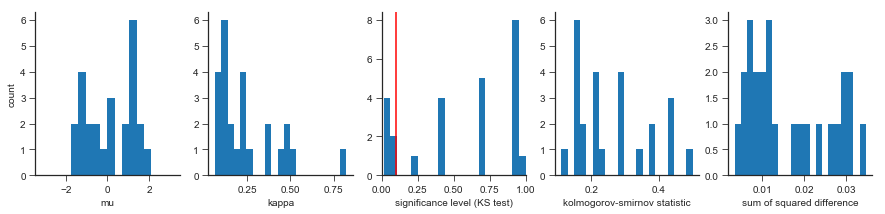

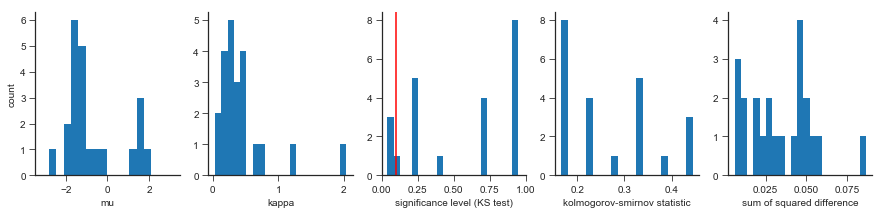

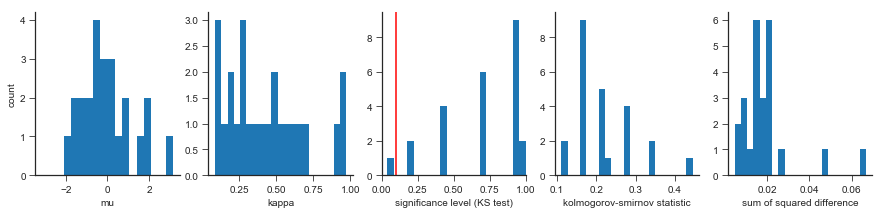

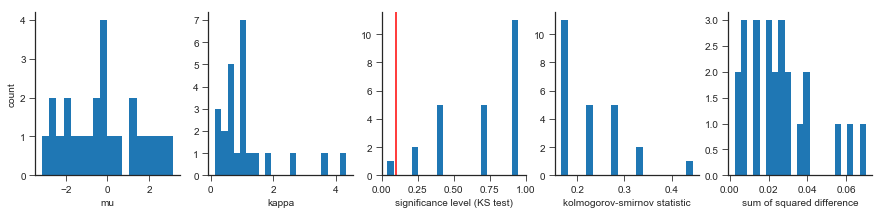

In [84]:
for scene in range(len(sceneNames)):
    sceneName = sceneNames[scene]
    fitFig = plt.figure(figsize=(15,3))

    bins = np.linspace(-np.pi, np.pi, 360/binwidth + 1)

    muax = fitFig.add_subplot(151)
    muax.hist(vmfits[scene,0,~np.isnan(vmfits[scene,0,:])],bins)
    #muax.set_xlim(-np.pi, np.pi)
    muax.set_ylabel('count')
    muax.set_xlabel('mu')
    myAxisTheme(muax)

    bins = np.linspace(0, 2, 21)
    kapax = fitFig.add_subplot(152)
    kapax.hist(vmfits[scene,1,~np.isnan(vmfits[scene,1,:])],len(bins))
    #kapax.set_xlim(0, 2)
    kapax.set_xlabel('kappa')
    myAxisTheme(kapax)

    bins = np.linspace(0, 1, 21)
    pax = fitFig.add_subplot(153)
    pax.hist(vmfits[scene,3,~np.isnan(vmfits[scene,3,:])],len(bins))
    pax.set_xlim(0, 1)
    pax.axvline(0.1,color='red')
    pax.set_xlabel('significance level (KS test)')

    bins = np.linspace(0, 1, 21)
    ksax = fitFig.add_subplot(154)
    ksax.hist(vmfits[scene,4,~np.isnan(vmfits[scene,4,:])],len(bins))
    #ksax.set_xlim(0, 1)
    ksax.set_xlabel('kolmogorov-smirnov statistic')
    myAxisTheme(ksax)

    bins = np.linspace(0, 1, 21)
    ksax = fitFig.add_subplot(155)
    ksax.hist(vmfits[scene,2,~np.isnan(vmfits[scene,2,:])],len(bins))
    #ksax.set_xlim(0, 1)
    ksax.set_xlabel('sum of squared difference')
    myAxisTheme(ksax)

    print(sceneName)
    print('flies with heading distribution that is significantly different from von Mieses fit (KS test):')
    print([flyIDs[fly] for fly in np.where(vmfits[scene,3,:]<=0.1)[0]])

    print('flies with large summed squared error:')
    print([flyIDs[fly] for fly in np.where(vmfits[scene,2,:]>=0.08)[0]])

    myAxisTheme(pax)

    fitFig.savefig(analysisDir + 'circStats/'  + genotype + '_' + sceneName
                   + '_vMFitDistributions_n'+ str(numFlies) +'.pdf', format='pdf') 

/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in less_equal
  


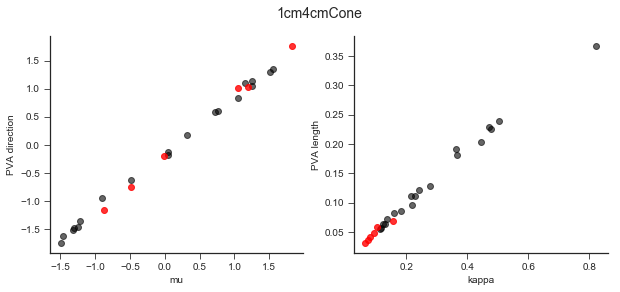

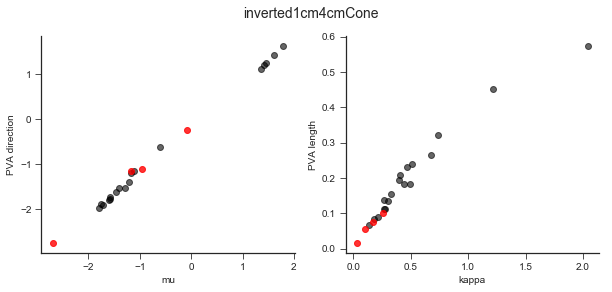

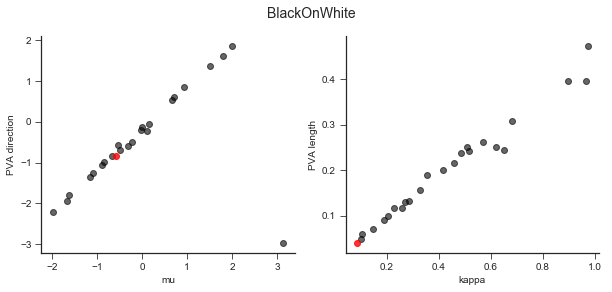

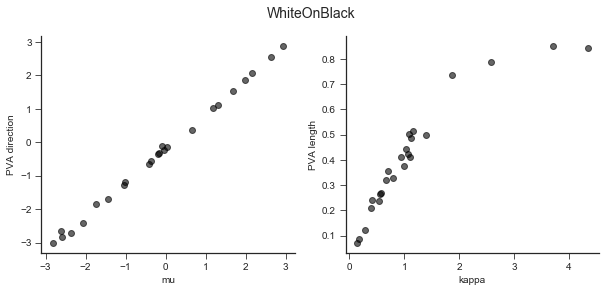

In [85]:
# Correlation between von Mieses fit and PVA
#Plot fit results
for scene in range(len(sceneNames)):
    sceneName = sceneNames[scene]
    corrFig = plt.figure(figsize=(10,4))
    corrFig.suptitle(sceneName,fontsize=14)

    notFit = np.logical_and(np.logical_and(vmfits[scene,3,:]<=0.1, headingPVA[scene,:,1]<0.5),\
                            ~np.isnan(headingPVA[scene,:,1]))

    #correlation between mu and PVA direction
    muax = corrFig.add_subplot(121)
    muax.plot(vmfits[scene,0,~notFit],headingPVA[scene,~notFit,0],'ko',alpha=0.6)
    muax.plot(vmfits[scene,0,notFit],headingPVA[scene,notFit,0],'ro',alpha=0.8)
    muax.set_xlabel('mu'); muax.set_ylabel('PVA direction');
    myAxisTheme(muax)

    #correlation between kappa and PVA length
    kapax = corrFig.add_subplot(122)
    kapax.plot(vmfits[scene,1,~notFit],headingPVA[scene,~notFit,1],'ko',alpha=0.6)
    kapax.plot(vmfits[scene,1,notFit],headingPVA[scene,notFit,1],'ro',alpha=0.8)
    kapax.set_xlabel('kappa'); kapax.set_ylabel('PVA length');
    myAxisTheme(kapax)

    corrFig.savefig(analysisDir + 'circStats/'  + genotype + '_' + sceneName
                   + '_vM-vs-PVA_n'+ str(numFlies) +'.pdf', format='pdf') 

/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in greater
  
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in greater
  
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in greater


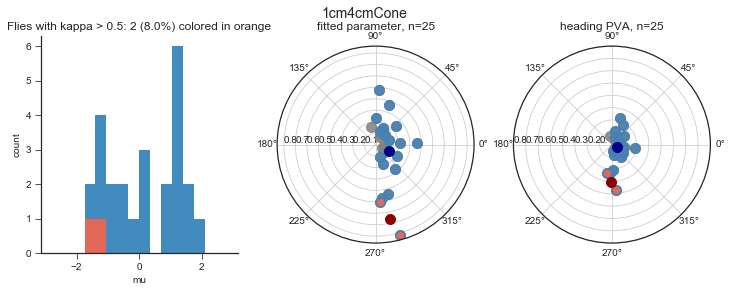

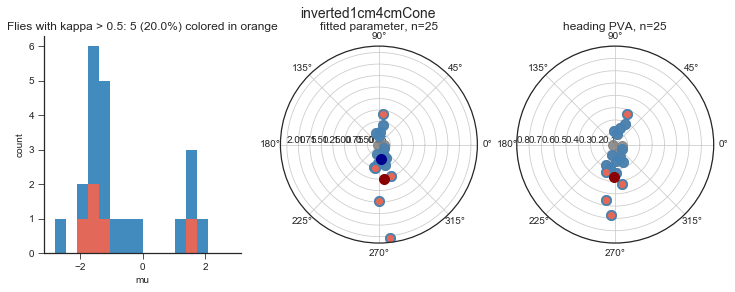

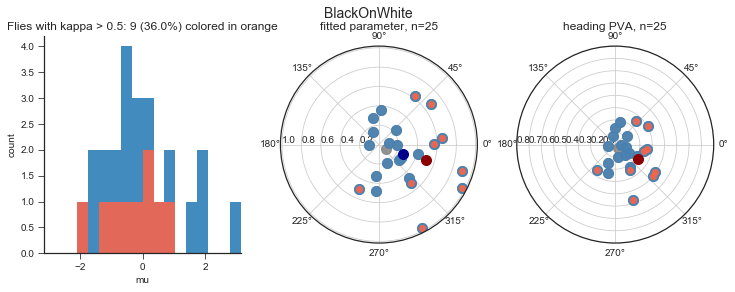

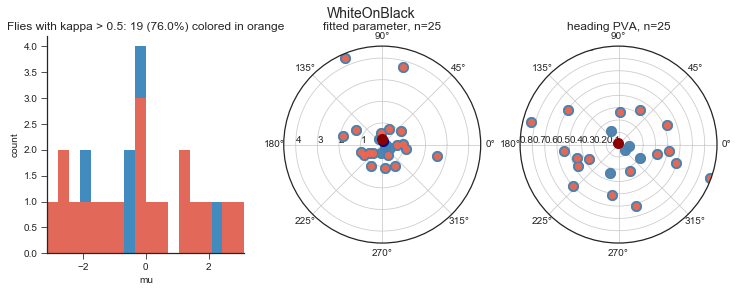

In [86]:
# number of flies with fitted von Mises with Kappa > 0.5 (disregarding also the flies that were not well represented by
# von Mises fit)

for scene in range(len(sceneNames)):
    sceneName = sceneNames[scene]
    goodFit = np.logical_and(np.logical_or(vmfits[scene,3,:]>0.1, headingPVA[scene,:,1]>0.5),\
                              ~np.isnan(headingPVA[scene,:,1]))

    slct = np.logical_and(vmfits[scene,1,:]>kappaTH,goodFit)

    bins = np.linspace(-np.pi, np.pi, 360/binwidth + 1)

    x = bins[:-1] + np.mean(np.diff(bins))
    [n,edg] = np.histogram(vmfits[scene,0,~np.isnan(vmfits[scene,0,:])],bins)
    [n_slct,edg] = np.histogram(vmfits[scene,0,slct],bins)

    #Plot fit results
    fixFig = plt.figure(figsize=(12,4))
    fixFig.suptitle(sceneName,fontsize=14)

    #histogram of fitted location (mu)
    muax = fixFig.add_subplot(131)
    muax.hist(vmfits[scene,0,~np.isnan(vmfits[scene,0,:])],bins,alpha=0.85)
    muax.hist(vmfits[scene,0,slct],bins,color='tomato',alpha=0.85)
    muax.set_xlim(-np.pi, np.pi)
    muax.set_xlabel('mu')
    muax.set_ylabel('count')
    muax.set_title('Flies with kappa > '+str(kappaTH)+': '+str(sum(vmfits[scene,1,:]>kappaTH))+' ('+\
                   str(round(100.0*sum(vmfits[scene,1,:]>kappaTH)/float(numFlies),3))+'%) colored in orange')
    myAxisTheme(muax)
    
    #polar plot of fitted location and shape parameter
    ax = fixFig.add_subplot(132,projection='polar')
    ax.plot(vmfits[scene,0,:],vmfits[scene,1,:],'o',markersize=10,color='grey',alpha=0.85)
    ax.plot(vmfits[scene,0,goodFit],vmfits[scene,1,goodFit],'o',markersize=10,color='steelblue',alpha=0.85)
    meandir, meanlen = circmeanvec(vmfits[scene,0,goodFit],vmfits[scene,1,goodFit], high=angleHigh, low=angleLow)
    ax.plot(meandir,meanlen,'o', color='darkblue',alpha=1, markersize=10)
    ax.plot(vmfits[scene,0,slct],vmfits[scene,1,slct],'.',markersize=12,color='tomato',alpha=0.85)
    meandir, meanlen = circmeanvec(vmfits[scene,0,slct],vmfits[scene,1,slct], high=angleHigh, low=angleLow)
    ax.plot(meandir,meanlen,'o', color='darkred',alpha=1, markersize=10)
    #ax.set_rlim(0,1)
    ax.set_rlabel_position(180)
    ax.set_title('fitted parameter, n='+str(numFlies))

    #polar plot of PVA
    ax = fixFig.add_subplot(133,projection='polar')
    ax.plot(headingPVA[scene,:,0],headingPVA[scene,:,1],'o',markersize=10,color='grey',alpha=0.85)
    ax.plot(headingPVA[scene,goodFit,0],headingPVA[scene,goodFit,1],'o',markersize=10,color='steelblue',alpha=0.85)
    meandir, meanlen = circmeanvec(headingPVA[scene,:,0],headingPVA[scene,:,1], high=angleHigh, low=angleLow)
    ax.plot(meandir,meanlen,'o', color='darkblue',alpha=1, markersize=10)

    ax.plot(headingPVA[scene,slct,0],headingPVA[scene,slct,1],'.',markersize=12,color='tomato',alpha=0.85)
    meandir, meanlen = circmeanvec(headingPVA[scene,slct,0],headingPVA[scene,slct,1], high=angleHigh, low=angleLow)
    ax.plot(meandir,meanlen,'o', color='darkred',alpha=1, markersize=10)
    ax.set_rlim(0,0.8)
    ax.set_rlabel_position(180)
    ax.set_title('heading PVA, n='+str(numFlies))
    
    #fixFig.tight_layout()
    fixFig.savefig(analysisDir + 'circStats/'  + genotype + '_' + sceneName
                   + '_vMFixation_n'+ str(numFlies) +'.pdf', format='pdf') 

### Fit bimodal von Mises to those distributions for which no good unimodal fit was found

1cm4cmCone
m03
m05
m17
m19
m21
m24
inverted1cm4cmCone
m08


/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in less_equal
  if sys.path[0] == '':


m14
m19
m21
BlackOnWhite
m19
WhiteOnBlack


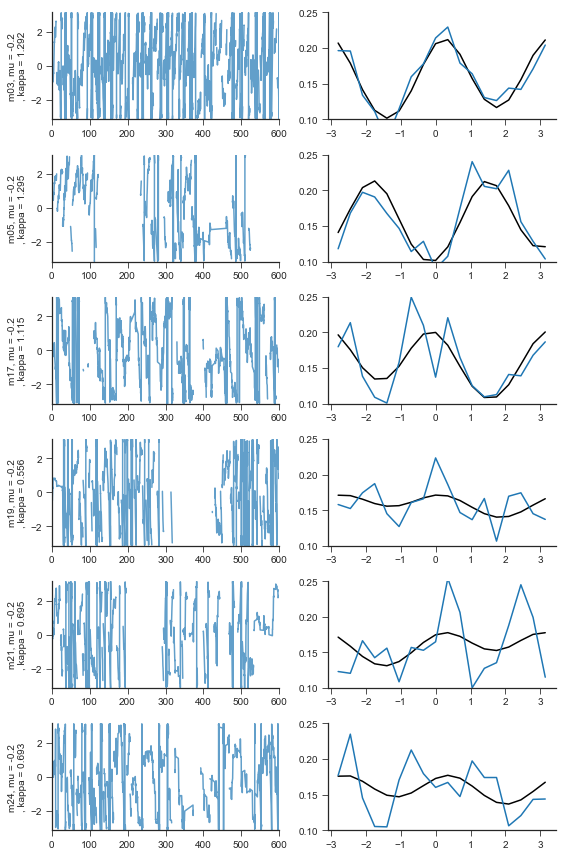

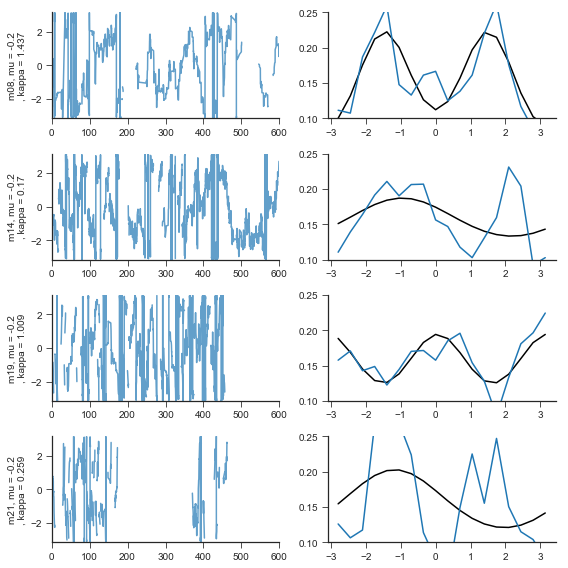

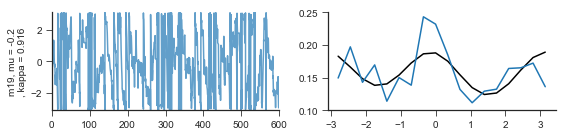

In [87]:
angleLow = -np.pi
angleHigh = np.pi

#bins size
binwidth = 20 #deg
numFlies = len(flyIDs)
vmbmfits = np.nan*np.ones((len(sceneNames),6,numFlies))

for scene, sceneName in enumerate(sceneNames):
    print(sceneName)
    
    noFit = np.logical_and(np.logical_and(vmfits[scene,3,:]<=0.1, headingPVA[scene,:,1]<0.5),\
                             ~np.isnan(headingPVA[scene,:,1]))
    
    notGoodFit = np.where(noFit>0)[0]
    
    if(len(notGoodFit)==0):
        continue
    
    fitFig = plt.figure(figsize=(8,2*len(notGoodFit)))
    
    for ind, fly in enumerate(notGoodFit):
        print(flyIDs[fly])
        querystring = '(sceneName=="' + sceneName + '") & (flyID =="' + flyIDs[fly] +  '")'
        moving = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze().astype('int').values

        perFlyG = FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1].squeeze().astype('float').values
        perFlyT = FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1].squeeze().astype('float').values

        if sum(moving)<=0.2*len(moving):
            print('fly '+str(flyIDs[fly])+' not moving: '+str(100.0*sum(moving)/max(1,len(moving))))

            continue

        gamFul = perFlyG[moving>0]
        time = perFlyT[moving>0]

        bins = np.linspace(angleLow,angleHigh, 360/binwidth + 1)
        x = bins[:-1] + np.mean(np.diff(bins))
        [n,edg] = np.histogram(gamFul,bins = 360/binwidth, range=(angleLow,angleHigh), normed=True)
        meandir_freq, meanlen_freq = circmeanvec(n,np.ones(len(n)), high=angleHigh, low=angleLow)

        mu01 = np.nanmax(n)
        mu02 = np.mod(mu01+2*np.pi,2*np.pi)-np.pi
        
        popt, pcov = curve_fit(vMbiModFunc, x, n, p0=[mu01,mu02,meanlen_freq],\
                               bounds=([-np.pi, -np.pi, 0], [np.pi, np.pi, np.inf]))
        mu1 = popt[0]
        mu2 = popt[1]
        kappa = popt[2]
        yhat = vMbiModFunc(x,mu1,mu2,kappa)

        #compute kolmogorov-smirnov statistic as measure of goodness of fit
        [ks, p] = sts.ks_2samp(n, yhat)

        #compute squared difference from fit
        sqd = np.sum(np.square(n-yhat))

        vmbmfits[scene,0,fly] = mu1
        vmbmfits[scene,1,fly] = mu2
        vmbmfits[scene,2,fly] = kappa
        vmbmfits[scene,3,fly] = sqd
        vmbmfits[scene,4,fly] = p
        vmbmfits[scene,5,fly] = ks

        #plot fit results
        ax = fitFig.add_subplot(len(notGoodFit),2,1+ind*2)
        ax.plot(time, gamFul,alpha=0.7)
        ax.set_xlim(0,600)
        ax.set_ylim(angleLow,angleHigh)
        ax.set_ylabel(str(flyIDs[fly])+', mu = '+str(round(mu,3)) +'\n, kappa = '+str(round(kappa,3)))
        myAxisTheme(ax)

        ax = fitFig.add_subplot(len(notGoodFit),2,2+ind*2)
        ax.plot(x,yhat,'k')
        ax.plot(x,n)
        ax.set_ylim(angleLow,angleHigh)
        ax.set_ylim(0.1,0.25)
        myAxisTheme(ax)

        fitFig.tight_layout()

    fitFig.savefig(analysisDir + 'circStats/'  + genotype + '_' + sceneName
                   + '_vMbiModFit_n'+ str(numFlies) +'.pdf', format='pdf') 

1cm4cmCone
flies with heading distribution that is significantly different from von Mieses fit (KS test):
[]


/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in less_equal


inverted1cm4cmCone
flies with heading distribution that is significantly different from von Mieses fit (KS test):
['m14', 'm21']
BlackOnWhite
flies with heading distribution that is significantly different from von Mieses fit (KS test):
[]
WhiteOnBlack
flies with heading distribution that is significantly different from von Mieses fit (KS test):
[]


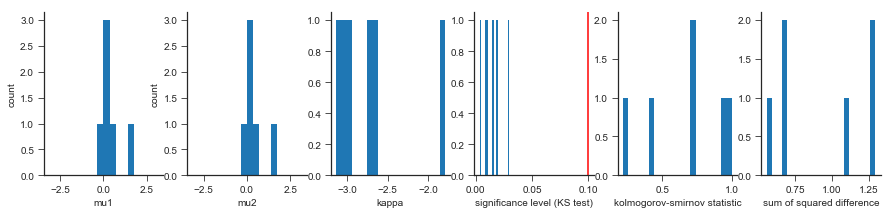

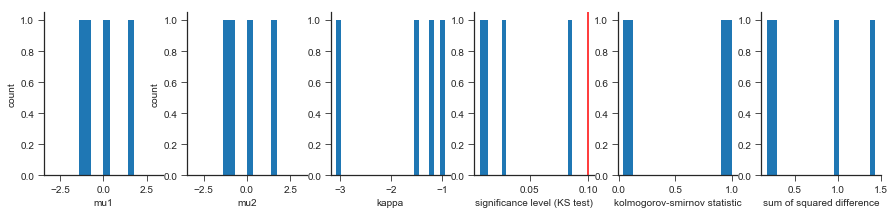

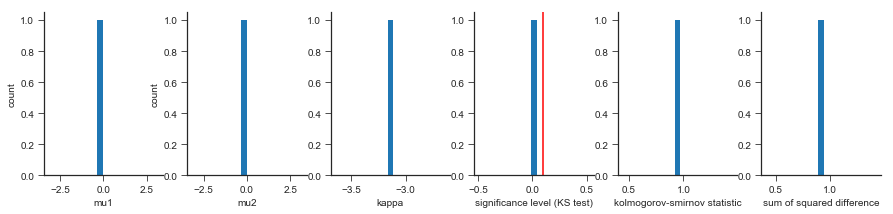

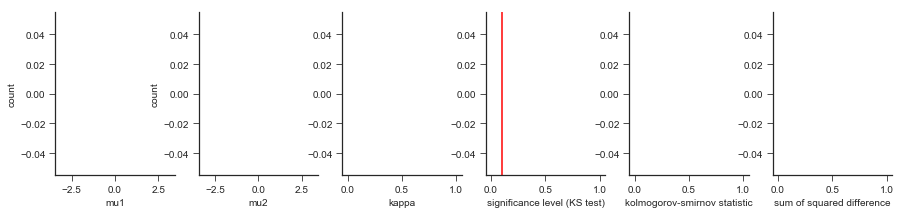

In [88]:
for scene in range(len(sceneNames)):
    sceneName = sceneNames[scene]
    fitFig = plt.figure(figsize=(15,3))

    bins = np.linspace(-np.pi, np.pi, 360/binwidth + 1)

    muax = fitFig.add_subplot(161)
    muax.hist(vmbmfits[scene,0,~np.isnan(vmbmfits[scene,0,:])],bins)
    muax.set_ylabel('count')
    muax.set_xlabel('mu1')
    myAxisTheme(muax)
    
    muax = fitFig.add_subplot(162)
    muax.hist(vmbmfits[scene,0,~np.isnan(vmbmfits[scene,1,:])],bins)
    muax.set_ylabel('count')
    muax.set_xlabel('mu2')
    myAxisTheme(muax)

    bins = np.linspace(0, 2, 21)
    kapax = fitFig.add_subplot(163)
    kapax.hist(vmbmfits[scene,1,~np.isnan(vmbmfits[scene,2,:])],len(bins))
    kapax.set_xlabel('kappa')
    myAxisTheme(kapax)

    bins = np.linspace(0, 1, 21)
    pax = fitFig.add_subplot(164)
    pax.hist(vmbmfits[scene,3,~np.isnan(vmbmfits[scene,4,:])],len(bins))
    #pax.set_xlim(0, 1)
    pax.axvline(0.1,color='red')
    pax.set_xlabel('significance level (KS test)')

    bins = np.linspace(0, 1, 21)
    ksax = fitFig.add_subplot(165)
    ksax.hist(vmbmfits[scene,4,~np.isnan(vmbmfits[scene,5,:])],len(bins))
    #ksax.set_xlim(0, 1)
    ksax.set_xlabel('kolmogorov-smirnov statistic')
    myAxisTheme(ksax)

    bins = np.linspace(0, 1, 21)
    ksax = fitFig.add_subplot(166)
    ksax.hist(vmbmfits[scene,2,~np.isnan(vmbmfits[scene,3,:])],len(bins))
    #ksax.set_xlim(0, 1)
    ksax.set_xlabel('sum of squared difference')
    myAxisTheme(ksax)

    print(sceneName)
    print('flies with heading distribution that is significantly different from von Mieses fit (KS test):')
    print([flyIDs[fly] for fly in np.where(vmbmfits[scene,4,:]<=0.1)[0]])

    myAxisTheme(pax)

    fitFig.savefig(analysisDir + 'circStats/'  + genotype + '_' + sceneName
                   + '_vMbiModFitDistributions_n'+ str(numFlies) +'.pdf', format='pdf') 

/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in greater
  # Remove the CWD from sys.path while we load stuff.
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in greater
  # This is added back by InteractiveShellApp.init_path()
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in greater
  import sys
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in greater
  


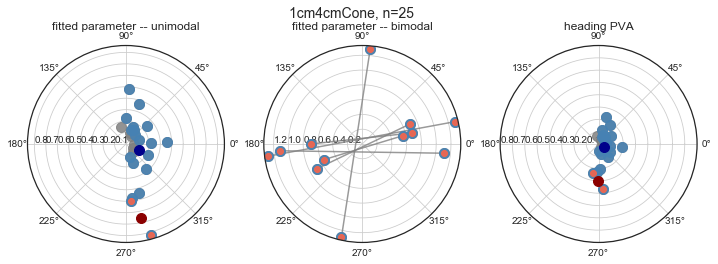

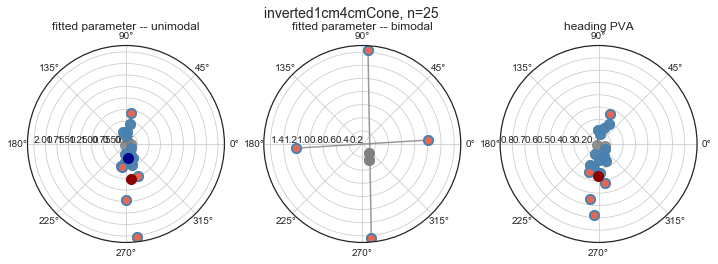

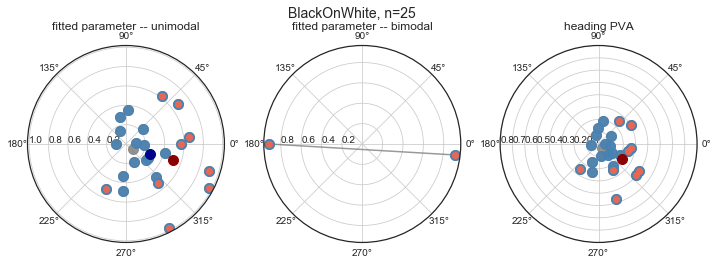

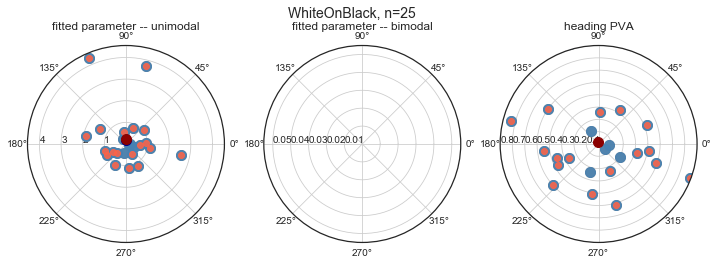

In [89]:
# number of flies with fitted von Mises with Kappa > 0.5 (disregarding also the flies that were not well represented by
# von Mises fit)

for scene in range(len(sceneNames)):
    sceneName = sceneNames[scene]
    
    goodFit = np.logical_and(np.logical_or(vmfits[scene,3,:]>0.1, headingPVA[scene,:,1]>0.5),\
                              ~np.isnan(headingPVA[scene,:,1]))
    slct = np.logical_and(vmfits[scene,1,:]>kappaTH,goodFit)
    
    goodFit_bm = vmbmfits[scene,4,:]>0.1
    slct_bm = np.logical_and(vmbmfits[scene,2,:]>kappaTH,goodFit_bm)

    #Plot fit results
    fixFig = plt.figure(figsize=(12,4))
    fixFig.suptitle(sceneName+', n='+str(numFlies),fontsize=14)

    #polar plot of fitted location and shape parameter - unimodal
    ax = fixFig.add_subplot(131,projection='polar')
    ax.plot(vmfits[scene,0,:],vmfits[scene,1,:],'o',markersize=10,color='grey',alpha=0.85)
    ax.plot(vmfits[scene,0,goodFit],vmfits[scene,1,goodFit],'o',markersize=10,color='steelblue',alpha=0.85)
    meandir, meanlen = circmeanvec(vmfits[scene,0,goodFit],vmfits[scene,1,goodFit], high=angleHigh, low=angleLow)
    ax.plot(meandir,meanlen,'o', color='darkblue',alpha=1, markersize=10)
    
    ax.plot(vmfits[scene,0,slct],vmfits[scene,1,slct],'.',markersize=12,color='tomato',alpha=0.85)
    meandir, meanlen = circmeanvec(vmfits[scene,0,slct],vmfits[scene,1,slct], high=angleHigh, low=angleLow)
    ax.plot(meandir,meanlen,'o', color='darkred',alpha=1, markersize=10)
    #ax.set_rlim(0,np.nanmax(vmfits[:,1,:]))
    ax.set_rlabel_position(180)
    ax.set_title('fitted parameter -- unimodal')
    
    #polar plot of fitted location and shape parameter - bimodal
    ax = fixFig.add_subplot(132,projection='polar')
    ax.plot(vmbmfits[scene,0,:],vmbmfits[scene,2,:],'o',markersize=10,color='grey',alpha=0.85)
    ax.plot(vmbmfits[scene,1,:],vmbmfits[scene,2,:],'o',markersize=10,color='grey',alpha=0.85)
    ax.plot([vmbmfits[scene,0,:],vmbmfits[scene,1,:]],[vmbmfits[scene,2,:],vmbmfits[scene,2,:]],'-',color='grey',alpha=0.8)
    ax.plot(vmbmfits[scene,0,goodFit_bm],vmbmfits[scene,2,goodFit_bm],'o',markersize=10,color='steelblue',alpha=0.85)
    ax.plot(vmbmfits[scene,1,goodFit_bm],vmbmfits[scene,2,goodFit_bm],'o',markersize=10,color='steelblue',alpha=0.85)

    ax.plot(vmbmfits[scene,0,slct_bm],vmbmfits[scene,2,slct_bm],'.',markersize=12,color='tomato',alpha=0.85)
    ax.plot(vmbmfits[scene,1,slct_bm],vmbmfits[scene,2,slct_bm],'.',markersize=12,color='tomato',alpha=0.85)

    #ax.set_rlim(0,3)#np.nanmax(vmbmfits[:,2,:]))
    ax.set_rlabel_position(180)
    ax.set_title('fitted parameter -- bimodal')

    #polar plot of PVA
    ax = fixFig.add_subplot(133,projection='polar')
    ax.plot(headingPVA[scene,:,0],headingPVA[scene,:,1],'o',markersize=10,color='grey',alpha=0.85)
    ax.plot(headingPVA[scene,goodFit,0],headingPVA[scene,goodFit,1],'o',markersize=10,color='steelblue',alpha=0.85)
    meandir, meanlen = circmeanvec(headingPVA[scene,:,0],headingPVA[scene,:,1], high=angleHigh, low=angleLow)
    ax.plot(meandir,meanlen,'o', color='darkblue',alpha=1, markersize=10)

    ax.plot(headingPVA[scene,slct,0],headingPVA[scene,slct,1],'.',markersize=12,color='tomato',alpha=0.85)
    meandir, meanlen = circmeanvec(headingPVA[scene,slct,0],headingPVA[scene,slct,1], high=angleHigh, low=angleLow)
    ax.plot(meandir,meanlen,'o', color='darkred',alpha=1, markersize=10)
    ax.set_rlim(0,0.8)
    ax.set_rlabel_position(180)
    ax.set_title('heading PVA')
    
    #fixFig.tight_layout()
    fixFig.savefig(analysisDir + 'circStats/'  + genotype + '_' + sceneName
                   + '_vMBiModFixation_n'+ str(numFlies) +'.pdf', format='pdf') 
    
    np.savetxt(analysisDir + 'circStats/'  + genotype + '_vMFixation_'+sceneName+'_n'+ str(numFlies) +'.csv',
           np.c_[vmfits[scene,0,:],vmfits[scene,1,:],goodFit,
            vmbmfits[scene,0,:],vmbmfits[scene,1,:],vmbmfits[scene,2,:],goodFit_bm],
            delimiter=',', header='mu,kappa,gof,mu1_bm,mu2_bm,kappa_bm,gof_bm')
    

/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in greater
  del sys.path[0]
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in greater
  
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in greater
  if __name__ == '__main__':
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in greater
  # Remove the CWD from sys.path while we load stuff.


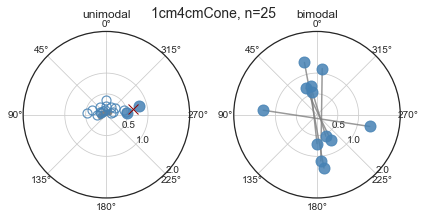

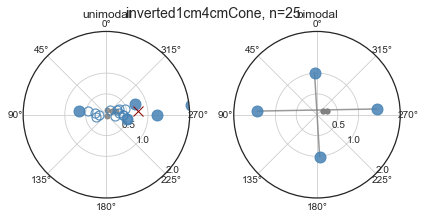

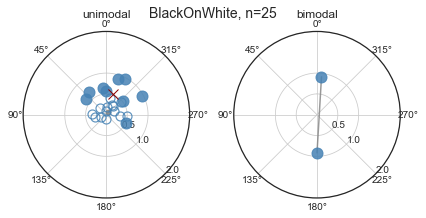

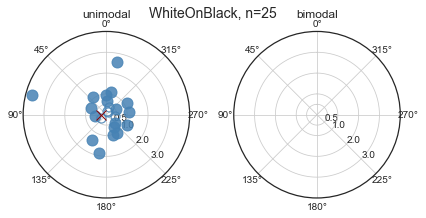

In [90]:
# number of flies with fitted von Mises with Kappa > 0.5 (disregarding also the flies that were not well represented by
# von Mises fit)

sceneYLim = [2,2,2,4]

for scene in range(len(sceneNames)):
    sceneName = sceneNames[scene]
    
    goodFit = np.logical_and(np.logical_or(vmfits[scene,3,:]>0.1, headingPVA[scene,:,1]>0.5),\
                              ~np.isnan(headingPVA[scene,:,1]))
    slct = np.logical_and(vmfits[scene,1,:]>kappaTH,goodFit)
    gfplt = np.logical_and(goodFit, ~slct)
    
    goodFit_bm = vmbmfits[scene,4,:]>0.1
    slct_bm = np.logical_and(vmbmfits[scene,2,:]>kappaTH,goodFit_bm)
    gfplt_bm = np.logical_and(goodFit_bm, ~slct_bm)

    #Plot fit results
    fixFig = plt.figure(figsize=(6,3))
    fixFig.suptitle(sceneName+', n='+str(numFlies),fontsize=14)

    #polar plot of fitted location and shape parameter - unimodal
    ax = fixFig.add_subplot(121,projection='polar')
    ax.plot(vmfits[scene,0,~goodFit],vmfits[scene,1,~goodFit],'.',markersize=10,color='grey',alpha=0.85)
    ax.plot(vmfits[scene,0,gfplt],vmfits[scene,1,gfplt],'o',markeredgecolor='steelblue',
            markerfacecolor='none',  markeredgewidth=1.2, markersize = 9,alpha=0.85)
    ax.plot(vmfits[scene,0,slct],vmfits[scene,1,slct],'o',markersize=11,color='steelblue',alpha=0.85)
    meandir, meanlen = circmeanvec(vmfits[scene,0,slct],vmfits[scene,1,slct], high=angleHigh, low=angleLow)
    ax.plot(meandir,meanlen,'x', color='darkred',alpha=1, markersize=10)

    ax.set_title('unimodal')
    ax.set_rlabel_position(225)
    ax.set_yticks([0.5, 1, 2, 3])
    ax.set_ylim(0, sceneYLim[scene])
    ax.set_theta_zero_location("N")
    
    #polar plot of fitted location and shape parameter - bimodal
    ax = fixFig.add_subplot(122,projection='polar')
    ax.plot(vmbmfits[scene,0,~goodFit_bm],vmbmfits[scene,2,~goodFit_bm],'.',markersize=10,color='grey',alpha=0.85)
    ax.plot(vmbmfits[scene,1,~goodFit_bm],vmbmfits[scene,2,~goodFit_bm],'.',markersize=10,color='grey',alpha=0.85)
    ax.plot([vmbmfits[scene,0,goodFit_bm],vmbmfits[scene,1,goodFit_bm]],
            [vmbmfits[scene,2,goodFit_bm],vmbmfits[scene,2,goodFit_bm]],'-',color='grey',alpha=0.8)
    ax.plot(vmbmfits[scene,0,gfplt_bm],vmbmfits[scene,2,gfplt_bm],'o',color='steelblue',markerfacecolor='none', 
            markeredgewidth=1.2, markersize = 9,alpha=0.85)
    ax.plot(vmbmfits[scene,1,gfplt_bm],vmbmfits[scene,2,gfplt_bm],'o',color='steelblue',markerfacecolor='none', 
            markeredgewidth=1.2, markersize = 9,alpha=0.85)
    ax.plot(vmbmfits[scene,0,slct_bm],vmbmfits[scene,2,slct_bm],'o',markersize=11,color='steelblue',alpha=0.85)
    ax.plot(vmbmfits[scene,1,slct_bm],vmbmfits[scene,2,slct_bm],'o',markersize=11,color='steelblue',alpha=0.85)

    ax.set_title('bimodal')
    ax.set_rlabel_position(225)
    ax.set_yticks([0.5, 1, 2, 3])
    ax.set_ylim(0, sceneYLim[scene])
    ax.set_theta_zero_location("N")
    
    fixFig.tight_layout()
    fixFig.savefig(analysisDir + 'circStats/'  + genotype + '_' + sceneName
                   + '_vMBiModFixation_n'+ str(numFlies) +'.pdf', format='pdf') 

/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in greater
  # This is added back by InteractiveShellApp.init_path()
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in greater
  if sys.path[0] == '':
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in greater
  
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in greater
  if __name__ == '__main__':
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/matplotlib/ticker.py:1707: UnicodeWarning: Unicode unequal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  if self._nbins != 'auto':


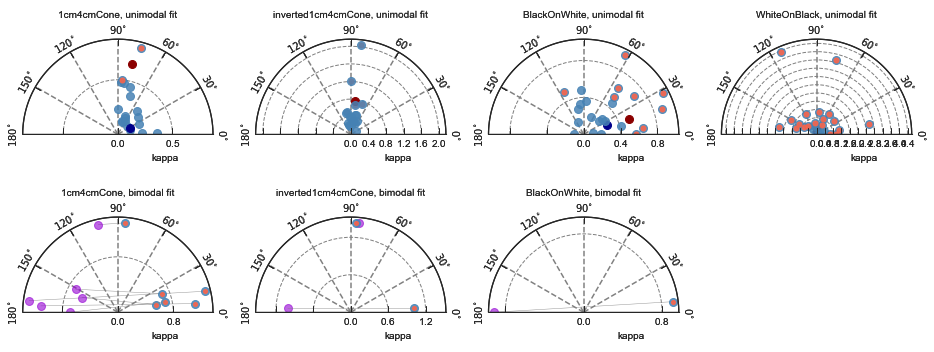

In [91]:
# number of flies with fitted von Mises with Kappa > 0.5 (disregarding also the flies that were not well represented by
# von Mises fit)

fixFig = plt.figure(figsize=(16,6))

for scene, sceneName in enumerate(sceneNames):
    
    goodFit = np.logical_and(np.logical_or(vmfits[scene,3,:]>0.1, headingPVA[scene,:,1]>0.5),\
                              ~np.isnan(headingPVA[scene,:,1]))
    slct = np.logical_and(vmfits[scene,1,:]>kappaTH,goodFit)
    
    goodFit_bm = vmbmfits[scene,4,:]>0.1
    slct_bm = np.logical_and(vmbmfits[scene,2,:]>kappaTH,goodFit_bm)

    #polar plot of fitted location and shape parameter - unimodal
    polplt = fractional_polar_axes(fixFig, thlim=(0, 180), rlim=(0, 1.06*np.nanmax(vmfits[scene,1,goodFit])),
                                   step=(30, 0.3), thlabel = sceneName+', unimodal fit',
                                   rlabel='kappa',subplotloc='24'+str(scene+1))
    polplt.plot(abs(vmfits[scene,0,goodFit])*180/np.pi,vmfits[scene,1,goodFit],'o',markersize=8,color='steelblue',alpha=0.85)
    meandir, meanlen = circmeanvec(vmfits[scene,0,goodFit],vmfits[scene,1,goodFit], high=angleHigh, low=angleLow)
    polplt.plot(abs(meandir)*180/np.pi,meanlen,'o', color='darkblue',alpha=1, markersize=8)
    
    polplt.plot(abs(vmfits[scene,0,slct])*180/np.pi,vmfits[scene,1,slct],'.',markersize=10,color='tomato',alpha=0.85)
    meandir, meanlen = circmeanvec(vmfits[scene,0,slct],vmfits[scene,1,slct], high=angleHigh, low=angleLow)
    polplt.plot(abs(meandir)*180/np.pi,meanlen,'o', color='darkred',alpha=1, markersize=8)
    
    #polar plot of fitted location and shape parameter - bimodal
    if sum(goodFit_bm):
        polplt = fractional_polar_axes(fixFig, thlim=(0, 180), rlim=(0, 1.06*np.nanmax(vmbmfits[scene,2,goodFit_bm])),
                                       step=(30, 0.5), thlabel = sceneName+', bimodal fit', 
                                       rlabel='kappa', subplotloc='24'+str(scene+5))
    
        polplt.plot(np.abs(vmbmfits[scene,0,goodFit_bm])*180.0/np.pi,vmbmfits[scene,2,goodFit_bm],'o',markersize=8,color='steelblue',alpha=0.85)
        polplt.plot(np.abs(vmbmfits[scene,1,goodFit_bm])*180.0/np.pi,vmbmfits[scene,2,goodFit_bm],'o',markersize=8,color='darkviolet',alpha=0.6)
    

        polplt.plot([np.abs(vmbmfits[scene,0,goodFit_bm])*180/np.pi,np.abs(vmbmfits[scene,1,goodFit_bm])*180/np.pi],
                    [vmbmfits[scene,2,goodFit_bm],vmbmfits[scene,2,goodFit_bm]],
                    '-',linewidth = 0.5, color='grey',alpha=0.8)

        polplt.plot(np.abs(vmbmfits[scene,0,slct_bm])*180.0/np.pi,vmbmfits[scene,2,slct_bm],'.',markersize=8,
                    color='tomato',alpha=0.85)

#fixFig.tight_layout()
#fixFig.savefig(analysisDir + 'circStats/'  + genotype
#               + '_vMBiModFixation3_n'+ str(numFlies) +'.pdf', format='pdf') 

### Selection of data

In [92]:
print('Total number of flies measured: ' + str(numFlies))

for scene,sceneName in enumerate(sceneNames):
    print('\n'+sceneName)
    
    goodFit = np.logical_and(np.logical_or(vmfits[scene,3,:]>0.1, headingPVA[scene,:,1]>0.5),\
                              ~np.isnan(headingPVA[scene,:,1]))
    slct = np.logical_and(vmfits[scene,1,:]>kappaTH,goodFit)
    
    goodFit_bm = vmbmfits[scene,4,:]>0.1
    
    slct_bm = np.logical_and(vmbmfits[scene,2,:]>kappaTH,goodFit_bm)
    
    print('Number of flies that walked for less than 20% of trial time: ' + str(int(fliesNotWalking[scene])) \
          + ' ('+str(numFlies)+')')
    
    print('Unimodal fits:')
    print('  Number of walking flies for which von Mises was good fit: ' + str(sum(goodFit))\
          + ' ('+str(numFlies-int(fliesNotWalking[scene]))+')')
    print('  Total number of fitted distributions with concentration measure kappa > '+str(kappaTH)+': '\
          +str(sum(vmfits[scene,1,:]>kappaTH)) + ' ('+str(numFlies-int(fliesNotWalking[scene]))+')')
    print('  Number of well fitted distributions with concentration measure kappa > '+str(kappaTH)+': '\
          +str(sum(vmfits[scene,1,goodFit]>kappaTH)) + ' ('+str(sum(goodFit))+')')

    print('Bimodal fits:')
    print('  Number of walking flies for which bimodal von Mises was good fit: ' + str(sum(goodFit_bm))\
          + ' ('+str(sum(~goodFit)-int(fliesNotWalking[scene]))+')')
    print('  Number of well fitted distributions with concentration measure kappa > '+str(kappaTH)+': '\
          +str(sum(vmbmfits[scene,2,goodFit_bm]>kappaTH)) + ' ('+str(sum(goodFit_bm))+')')

Total number of flies measured: 25

1cm4cmCone
Number of flies that walked for less than 20% of trial time: 0 (25)
Unimodal fits:
  Number of walking flies for which von Mises was good fit: 19 (25)
  Total number of fitted distributions with concentration measure kappa > 0.5: 2 (25)
  Number of well fitted distributions with concentration measure kappa > 0.5: 2 (19)
Bimodal fits:
  Number of walking flies for which bimodal von Mises was good fit: 6 (6)
  Number of well fitted distributions with concentration measure kappa > 0.5: 6 (6)

inverted1cm4cmCone
Number of flies that walked for less than 20% of trial time: 3 (25)
Unimodal fits:
  Number of walking flies for which von Mises was good fit: 18 (22)
  Total number of fitted distributions with concentration measure kappa > 0.5: 5 (22)
  Number of well fitted distributions with concentration measure kappa > 0.5: 5 (18)
Bimodal fits:
  Number of walking flies for which bimodal von Mises was good fit: 2 (4)
  Number of well fitted distr

/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in greater
  if __name__ == '__main__':
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in greater
  # This is added back by InteractiveShellApp.init_path()
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in greater
  
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in greater
  import sys
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in greater


### Use Rayleigh test on mean fixation location (on selected data, conditioned on good fit with unimodal von Mises)

In [93]:
# ...based on on fitted location parameter mu

for scene in range(len(sceneNames)):
    sceneName = sceneNames[scene]
    print('\n'+sceneName)
    
    goodFit = np.logical_and(np.logical_or(vmfits[scene,3,:]>0.1, headingPVA[scene,:,1]>0.5),\
                              ~np.isnan(headingPVA[scene,:,1]))
    
    slct = np.logical_and(vmfits[scene,1,:]>kappaTH,goodFit)

    fitSamples = len(vmfits[scene,0,slct])
    
    PVAdir, PVAlen = circmeanvec(vmfits[scene,0,slct],np.ones(fitSamples), high=angleHigh, low=angleLow)

    [z,p] = RayleighTest(PVAlen,fitSamples)

    print('Test statistic z = ' + str(z))
    print('Probability of test statistic p = ' + str(p))
    if (p<0.001):
        print('Reject H0 that sample is drawn from a uniform distribution (p<0.001).')
        print('Mean angle = ' + str(round(PVAdir,3)) + ' ('+ str(round(PVAdir*180/np.pi,3))+' deg)')
    elif (p<0.01): 
        print('Reject H0 that sample is drawn from a uniform distribution (p<0.01).')
        print('Mean angle = ' + str(round(PVAdir,3)) + ' ('+ str(round(PVAdir*180/np.pi,3))+' deg)')
    elif (p<0.05): 
        print('Reject H0 that sample is drawn from a uniform distribution (p<0.05).')
        print('Mean angle = ' + str(round(PVAdir,3)) + ' ('+ str(round(PVAdir*180/np.pi,3))+' deg)')
    else:
        print('Accept H0 that sample is drawn from a uniform distribution (p>0.01).')


1cm4cmCone
Test statistic z = 1.98293065551
Probability of test statistic p = 0.138438851693
Accept H0 that sample is drawn from a uniform distribution (p>0.01).

inverted1cm4cmCone
Test statistic z = 1.74249139516
Probability of test statistic p = 0.179372918055
Accept H0 that sample is drawn from a uniform distribution (p>0.01).

BlackOnWhite
Test statistic z = 4.23845922005
Probability of test statistic p = 0.0104265658659
Reject H0 that sample is drawn from a uniform distribution (p<0.05).
Mean angle = -0.299 (-17.141 deg)

WhiteOnBlack
Test statistic z = 0.0497607715988
Probability of test statistic p = 0.952643020856
Accept H0 that sample is drawn from a uniform distribution (p>0.01).


/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in greater
  import sys
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in greater
  if __name__ == '__main__':


### Visualise performance with bar plot

1cm4cmCone
inverted1cm4cmCone
BlackOnWhite
WhiteOnBlack


/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in greater
  
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in greater
  from ipykernel import kernelapp as app
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in greater
  # This is added back by InteractiveShellApp.init_path()
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in greater
  if sys.path[0] == '':


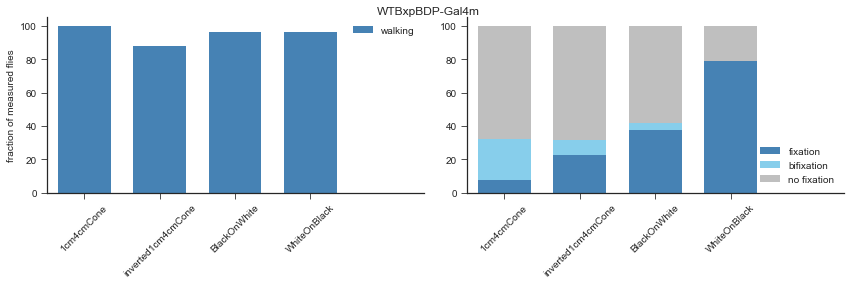

In [94]:
fixBarFig, ax  = plt.subplots(1, 2, figsize=(12,4))
width = 0.7
permSceneNames = [sceneNames[1],sceneNames[2],sceneNames[0]]
permscene = [1,2,0]
for scene, scenename in enumerate(sceneNames):
    print(scenename)
    scene
    
    walking = 100.0*(numFlies - int(fliesNotWalking[scene]))/numFlies
    
    goodFit = np.logical_and(np.logical_or(vmfits[scene,3,:]>0.1, headingPVA[scene,:,1]>0.5),\
                              ~np.isnan(headingPVA[scene,:,1]))
    slct = np.logical_and(vmfits[scene,1,:]>kappaTH,goodFit)
    
    goodFit_bm = vmbmfits[scene,4,:]>0.1
    slct_bm = np.logical_and(vmbmfits[scene,2,:]>kappaTH,goodFit_bm)
    
    fixating = 100.0*sum(vmfits[scene,1,goodFit]>kappaTH)/(numFlies - int(fliesNotWalking[scene]))
    bifixating = 100.0*sum(vmbmfits[scene,2,goodFit_bm]>kappaTH)/(numFlies - int(fliesNotWalking[scene]))
    
    p11 = ax[0].bar(scene, walking, width, color='steelblue', alpha=1)
    
    p21 = ax[1].bar(scene, fixating, width, color='steelblue')
    p22 = ax[1].bar(scene, bifixating, width, bottom=fixating, color='skyblue')
    p23 = ax[1].bar(scene, 100.0-(fixating+bifixating), width, bottom=(fixating+bifixating),
                 color='grey', alpha=0.5)
    
ax[0].legend([p11], ['walking'])
ax[0].set_ylabel('fraction of measured flies')
ax[0].set_xlim(-0.5, len(sceneNames)+0.5)
plt.sca(ax[0])
plt.xticks(range(len(sceneNames)), sceneNames, rotation=45)
myAxisTheme(ax[0])

ax[1].legend([p21, p22, p23], ['fixation','bifixation', 'no fixation'])
ax[1].set_xlim(-0.5, len(sceneNames)+0.5)
plt.sca(ax[1])
plt.xticks(range(len(sceneNames)), sceneNames, rotation=45)
myAxisTheme(ax[1])

fixBarFig.suptitle(genotypeSex)
fixBarFig.tight_layout()

fixBarFig.savefig(analysisDir + 'circStats/'  + genotype +
                   '_fixationBarPlot_n'+ str(numFlies) +'.pdf', format='pdf') 

## Relationship between walking velocity and fixation

1cm4cmCone


/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in greater
  import sys
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in greater
  # This is added back by InteractiveShellApp.init_path()


inverted1cm4cmCone


/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in greater
  
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in greater
  # Remove the CWD from sys.path while we load stuff.


BlackOnWhite
WhiteOnBlack


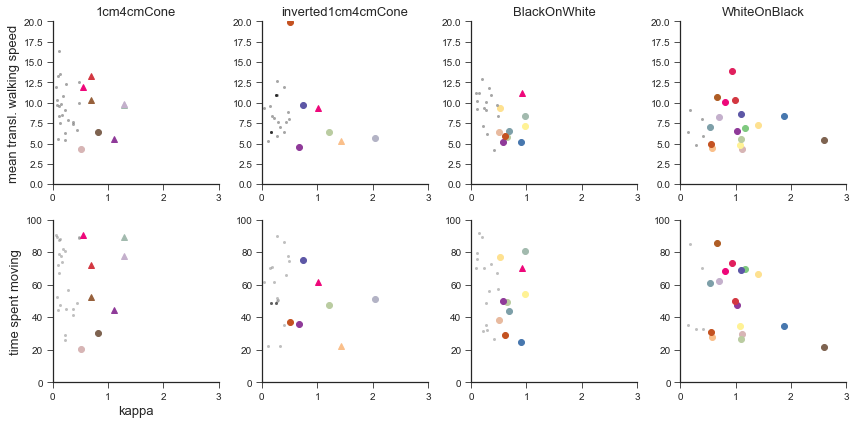

In [95]:
walkingCorr, axs = plt.subplots(2, len(sceneNames), figsize=(12,6))

for scene, sceneName in enumerate(sceneNames):
    print(sceneName)
    
    goodFit = np.logical_and(np.logical_or(vmfits[scene,3,:]>0.1, headingPVA[scene,:,1]>0.5),\
                                  ~np.isnan(headingPVA[scene,:,1]))
    goodFit_bm = vmbmfits[scene,4,:]>0.1

    kappasFly = [vmfits[scene,1,:], vmbmfits[scene,2,:]]
    slct = [np.logical_and(vmfits[scene,1,:]>kappaTH,goodFit),
            np.logical_and(vmbmfits[scene,2,:]>kappaTH,goodFit_bm)]

    markerstyle = [('grey', 'o'), ('black','^')]
    
    for fly in range(numFlies):
        querystring = '(flyID == "' + flyIDs[fly] + '" & sceneName == "'+sceneName+'")'

        flyMov = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze()
        flyVT = FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1].squeeze()

        for i in range(2):
            if slct[i][fly]:
                axs[0][scene].plot(kappasFly[i][fly], np.nanmean(flyVT[flyMov>0]), markerstyle[i][1], color=flyCMap.to_rgba(fly))
            else:
                axs[0][scene].plot(kappasFly[i][fly], np.nanmean(flyVT[flyMov>0]), '.',
                                   markerfacecolor=markerstyle[i][0], markeredgecolor='none', alpha=.7)

            if slct[i][fly]:
                axs[1][scene].plot(kappasFly[i][fly], 100.*np.sum(flyMov)/len(flyMov), markerstyle[i][1], color=flyCMap.to_rgba(fly))
            else:
                axs[1][scene].plot(kappasFly[i][fly], 100.*np.sum(flyMov)/len(flyMov), '.', 
                                   markerfacecolor=markerstyle[i][0], markeredgecolor='none', alpha=.5) 

    if not scene:
        axs[0,scene].set_ylabel('mean transl. walking speed', fontsize=13)
        axs[1,scene].set_xlabel('kappa', fontsize=13)
        axs[1,scene].set_ylabel('time spent moving', fontsize=13)
    axs[0,scene].set_xlim(0, 3)
    axs[0,scene].set_ylim(0, 20)
    axs[1,scene].set_xlim(0, 3)
    axs[1,scene].set_ylim(0, 100)
    axs[0,scene].set_title(sceneName, fontsize=13)
    [myAxisTheme(axs[i,scene]) for i in range(2)]
    
walkingCorr.tight_layout()
walkingCorr.savefig(analysisDir + 'velocityTraces'+sep+genotype+'_walkingCorr_n'+ str(numFlies)+'.pdf') 

## Comparison between fixation in 1D and 2D
### Is there a correlation between the location of the fixation peak in 1D and 2D?

BlackOnWhite vs 1cm4cmCone


/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in greater
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in greater


WhiteOnBlack vs inverted1cm4cmCone


/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in greater
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater


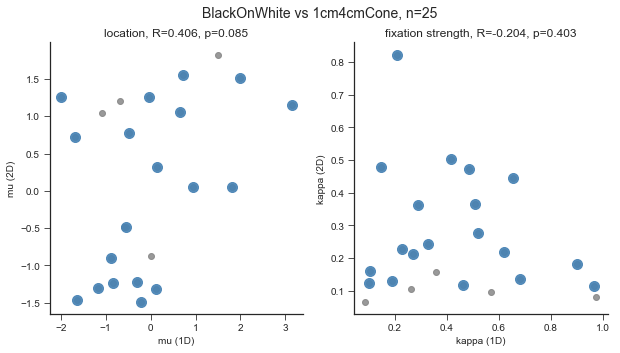

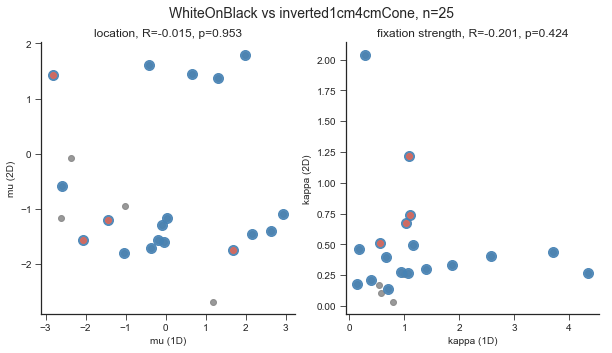

In [96]:
# number of flies with fitted von Mises with Kappa > 0.5 (disregarding also the flies that were not well represented by
# von Mises fit)

kappaTH = 0.5

groups = [(0,2),(1,3)]

for ind, group in enumerate(groups):
    scene1D = sceneNames[group[1]]
    scene2D = sceneNames[group[0]]
    
    print(scene1D + ' vs ' + scene2D)
    
    #Plot fit results
    fix1Dvs2DFig = plt.figure(figsize=(10,5))
    fix1Dvs2DFig.suptitle(scene1D + ' vs ' + scene2D + ', n='+str(numFlies),fontsize=14)
    
    ## Unimodal
    goodFit1D = np.logical_and(np.logical_or(vmfits[group[1],3,:]>0.1, headingPVA[group[1],:,1]>0.5),\
                              ~np.isnan(headingPVA[group[1],:,1]))
    goodFit2D = np.logical_and(np.logical_or(vmfits[group[0],3,:]>0.1, headingPVA[group[0],:,1]>0.5),\
                              ~np.isnan(headingPVA[group[0],:,1]))
    goodFit = np.logical_and(goodFit1D,goodFit2D)
    
    slct1D = np.logical_and(vmfits[group[1],1,:]>kappaTH,goodFit1D)
    slct2D = np.logical_and(vmfits[group[0],1,:]>kappaTH,goodFit2D)
    slct = np.logical_and(slct1D,slct2D)

    #correlation between fixation location in 1D and 2D
    ax = fix1Dvs2DFig.add_subplot(121)
    ax.plot(vmfits[group[1],0,:],vmfits[group[0],0,:],'o',markersize=6,color='grey',alpha=0.8)
    ax.plot(vmfits[group[1],0,goodFit],vmfits[group[0],0,goodFit],'o',markersize=10,color='steelblue',alpha=0.9)
    ax.plot(vmfits[group[1],0,slct],vmfits[group[0],0,slct],'.',markersize=12,color='tomato',alpha=0.7)
    ax.set_xlabel('mu (1D)')
    ax.set_ylabel('mu (2D)')
    pR, pp = sts.pearsonr(vmfits[group[1],0,goodFit], vmfits[group[0],0,goodFit])
    ax.set_title('location, R='+str(round(pR,3))+', p='+str(round(pp,3)))
    myAxisTheme(ax)
    
    #correlation between fixation strength in 1D and 2D
    ax = fix1Dvs2DFig.add_subplot(122)
    ax.plot(vmfits[group[1],1,:],vmfits[group[0],1,:],'o',markersize=6,color='grey',alpha=0.8)
    ax.plot(vmfits[group[1],1,goodFit],vmfits[group[0],1,goodFit],'o',markersize=10,color='steelblue',alpha=0.9)
    ax.plot(vmfits[group[1],1,slct],vmfits[group[0],1,slct],'.',markersize=12,color='tomato',alpha=0.7)
    ax.set_xlabel('kappa (1D)')
    ax.set_ylabel('kappa (2D)')
    pR, pp = sts.pearsonr(vmfits[group[1],1,goodFit], vmfits[group[0],1,goodFit])
    ax.set_title('fixation strength, R='+str(round(pR,3))+', p='+str(round(pp,3)))
    myAxisTheme(ax)
    
    fix1Dvs2DFig.savefig(analysisDir + 'circStats/'  + genotype + '_' + scene1D + 'Vs' + scene2D
                   + '-Fixation_n'+ str(numFlies) +'.pdf', format='pdf') 

### Velocity vs. stripe/object location

In [90]:
# enable R Kernel 
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [39]:
FOAllFlies_df

,flyID,trial,trialtype,sceneName,gamma,gammaFull,headingAngle,rotVelo,time,transVelo,xPos,xPosInMiniarena,yPos,yPosInMiniarena,moving
0,m01,1.0,plane,1cm4cmCone,NaN,NaN,-0.000004,-1.265835,0.000000,1.019462,60.622000,NaN,35.000000,NaN,0.0
1,m01,1.0,plane,1cm4cmCone,NaN,NaN,-0.063304,-1.107775,0.050007,2.363040,60.619010,NaN,34.949108,NaN,1.0
2,m01,1.0,plane,1cm4cmCone,NaN,NaN,-0.118700,0.158245,0.100013,2.367252,60.685396,NaN,35.046865,NaN,1.0
3,m01,1.0,plane,1cm4cmCone,NaN,NaN,-0.110787,0.474736,0.150020,5.536594,60.751600,NaN,35.145000,NaN,1.0
4,m01,1.0,plane,1cm4cmCone,NaN,NaN,-0.087047,0.237372,0.200027,8.311284,61.027056,NaN,35.172913,NaN,1.0
5,m01,1.0,plane,1cm4cmCone,NaN,NaN,-0.075177,1.345086,0.250033,7.252138,61.323404,NaN,35.464319,NaN,1.0
6,m01,1.0,plane,1cm4cmCone,NaN,NaN,-0.007913,1.819827,0.300040,8.667304,61.654092,NaN,35.613195,NaN,1.0
7,m01,1.0,plane,1cm4cmCone,NaN,NaN,0.083090,1.819823,0.350046,8.168875,62.020086,NaN,35.845366,NaN,1.0
8,m01,1.0,plane,1cm4cmCone,NaN,NaN,0.174093,0.712101,0.400053,4.476958,62.427158,NaN,35.879474,NaN,1.0
9,m01,1.0,plane,1cm4cmCone,NaN,NaN,0.209703,-0.158245,0.450060,3.764867,62.650908,NaN,35.871920,NaN,1.0


In [ ]:
#querystring = '(sceneName=="' + sceneName + '") & (flyID =="' + flyIDs[fly] +  '")'
#moving = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze().astype('int').values

In [72]:
subset_df =  FOAllFlies_df.query('moving > 0')
subset_df

,flyID,trial,trialtype,sceneName,gamma,gammaFull,headingAngle,rotVelo,time,transVelo,xPos,xPosInMiniarena,yPos,yPosInMiniarena,moving
1,m01,1.0,plane,1cm4cmCone,NaN,NaN,-0.063304,-1.107775,0.050007,2.363040,60.619010,NaN,34.949108,NaN,1.0
2,m01,1.0,plane,1cm4cmCone,NaN,NaN,-0.118700,0.158245,0.100013,2.367252,60.685396,NaN,35.046865,NaN,1.0
3,m01,1.0,plane,1cm4cmCone,NaN,NaN,-0.110787,0.474736,0.150020,5.536594,60.751600,NaN,35.145000,NaN,1.0
4,m01,1.0,plane,1cm4cmCone,NaN,NaN,-0.087047,0.237372,0.200027,8.311284,61.027056,NaN,35.172913,NaN,1.0
5,m01,1.0,plane,1cm4cmCone,NaN,NaN,-0.075177,1.345086,0.250033,7.252138,61.323404,NaN,35.464319,NaN,1.0
6,m01,1.0,plane,1cm4cmCone,NaN,NaN,-0.007913,1.819827,0.300040,8.667304,61.654092,NaN,35.613195,NaN,1.0
7,m01,1.0,plane,1cm4cmCone,NaN,NaN,0.083090,1.819823,0.350046,8.168875,62.020086,NaN,35.845366,NaN,1.0
8,m01,1.0,plane,1cm4cmCone,NaN,NaN,0.174093,0.712101,0.400053,4.476958,62.427158,NaN,35.879474,NaN,1.0
9,m01,1.0,plane,1cm4cmCone,NaN,NaN,0.209703,-0.158245,0.450060,3.764867,62.650908,NaN,35.871920,NaN,1.0
10,m01,1.0,plane,1cm4cmCone,NaN,NaN,0.201790,-1.345083,0.500066,3.069744,62.810266,NaN,35.771672,NaN,1.0


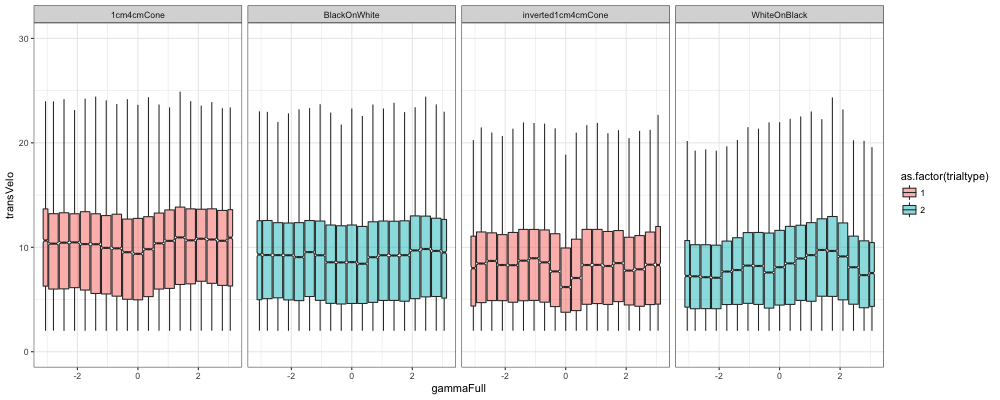

In [86]:
%%R -i subset_df -w 1000 -h 400 -u px

library(ggplot2)

x <- ggplot(subset_df, aes(x=gammaFull, y=transVelo))
x <- x + geom_boxplot(aes(group = cut_width(gammaFull, 2.0*pi/18),fill=as.factor(trialtype)),notch=TRUE, outlier.shape=NA, alpha=0.5)
x <- x + facet_grid(. ~ sceneName)+ theme_bw() + ylim(0,30)
print(x)

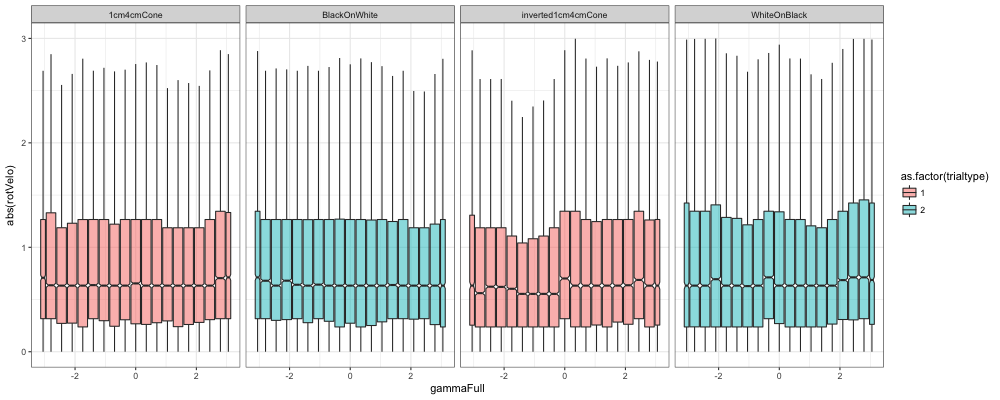

In [87]:
%%R -i subset_df -w 1000 -h 400 -u px

library(ggplot2)

x <- ggplot(subset_df, aes(x=gammaFull, y=abs(rotVelo)))
x <- x + geom_boxplot(aes(group = cut_width(gammaFull, 2.0*pi/18),fill=as.factor(trialtype)),notch=TRUE, outlier.shape=NA, alpha=0.5)
x <- x + facet_grid(. ~ sceneName) + ylim(0, 3) + theme_bw()
print(x)

In [83]:
%%R -i subset_df -w 1000 -h 400 -u px

library(ggplot2)

x <- ggplot(subset_df)
x <- x + geom_bar(aes(group = cut_width(gammaFull, 2.0*pi/18),stat = "identity", fill=as.factor(trialtype)), alpha=0.5)
x <- x + facet_grid(. ~ sceneName) + ylim(0, 10) + theme_bw()
print(x)


Error: stat_count requires the following missing aesthetics: x


/Users/hannah/anaconda/lib/python2.7/site-packages/rpy2/rinterface/__init__.py:186: RRuntimeWarning: Error: stat_count requires the following missing aesthetics: x

  warnings.warn(x, RRuntimeWarning)
/Users/hannah/anaconda/lib/python2.7/site-packages/rpy2/rinterface/__init__.py:186: RRuntimeWarning: There were 11 warnings (use warnings() to see them)
  warnings.warn(x, RRuntimeWarning)
/Users/hannah/anaconda/lib/python2.7/site-packages/rpy2/rinterface/__init__.py:186: RRuntimeWarning: Error in dev.off() : 
  QuartzBitmap_Output - unable to open file '/var/folders/5d/08jnsv0x0x1g6pzpvf5744kh0000gp/T/tmpvRqJnX/Rplots001.png'

  warnings.warn(x, RRuntimeWarning)


RRuntimeError: Error in dev.off() : 
  QuartzBitmap_Output - unable to open file '/var/folders/5d/08jnsv0x0x1g6pzpvf5744kh0000gp/T/tmpvRqJnX/Rplots001.png'


## Intergroup comparison -- uses saved data in csv file

In [92]:
dataDir = sep.join(analysisDir.split(sep)[:-5]) + '/'
groupFile = 'WTB_vMFixation_allData' #'allGentype_vMFixation_highT-cut' # 
fitdata_df = pd.read_csv(dataDir + groupFile + '.csv')
fitdata_df

,genotype,group,wings,room temp,sex,scene,contrast,sceneName,trialType,flyID,mu,kappa,gof,mu1_bm,mu2_bm,kappa_bm,gof_bm
0,WTB,high-T-cut,cut,high,male,1D,darkOnBright,BlackOnWhite,1,1,-1.560,0.3870,1,NaN,NaN,NaN,0
1,WTB,high-T-cut,cut,high,male,1D,darkOnBright,BlackOnWhite,1,2,0.340,0.0932,0,-0.0539,-3.140,0.7710,0
2,WTB,high-T-cut,cut,high,male,1D,darkOnBright,BlackOnWhite,1,3,-0.159,0.4560,1,NaN,NaN,NaN,0
3,WTB,high-T-cut,cut,high,male,1D,darkOnBright,BlackOnWhite,1,4,2.750,0.1170,0,1.3400,-2.250,0.5550,0
4,WTB,high-T-cut,cut,high,male,1D,darkOnBright,BlackOnWhite,1,5,0.671,0.1730,1,NaN,NaN,NaN,0
5,WTB,high-T-cut,cut,high,male,1D,darkOnBright,BlackOnWhite,1,6,1.410,0.2730,1,NaN,NaN,NaN,0
6,WTB,high-T-cut,cut,high,male,1D,darkOnBright,BlackOnWhite,1,7,-0.302,0.2300,1,NaN,NaN,NaN,0
7,WTB,high-T-cut,cut,high,male,1D,darkOnBright,BlackOnWhite,1,8,1.060,0.2050,1,NaN,NaN,NaN,0
8,WTB,high-T-cut,cut,high,male,1D,darkOnBright,BlackOnWhite,1,9,-0.658,0.1090,0,1.6300,-1.320,0.9370,1
9,WTB,high-T-cut,cut,high,male,1D,darkOnBright,BlackOnWhite,1,10,1.060,0.3060,1,NaN,NaN,NaN,0


In [93]:
fitdata_df["genotype"] = fitdata_df["genotype"].astype('category')
fitdata_df["wings"] = fitdata_df["wings"].astype('category')
fitdata_df["room temp"] = fitdata_df["room temp"].astype('category')
fitdata_df["sex"] = fitdata_df["sex"].astype('category')
fitdata_df["scene"] = fitdata_df["scene"].astype('category')
fitdata_df["contrast"] = fitdata_df["contrast"].astype('category')
fitdata_df["sceneName"] = fitdata_df["sceneName"].astype('category')
fitdata_df["group"] = fitdata_df["group"].astype('category')

dict(enumerate(fitdata_df.group.cat.categories) )

{0: 'high-T-cut', 1: 'high-T-glued', 2: 'low-T-cut'}

### By group analysis

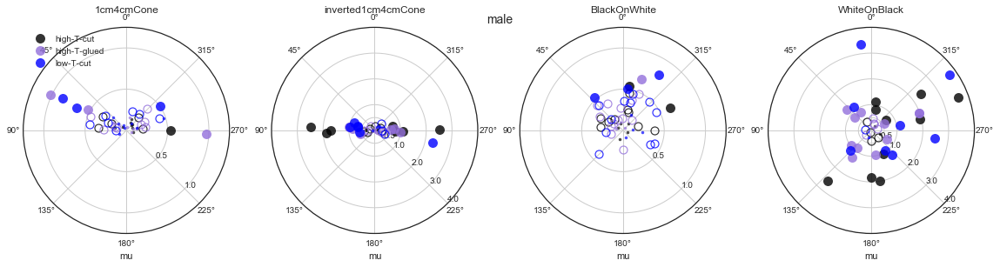

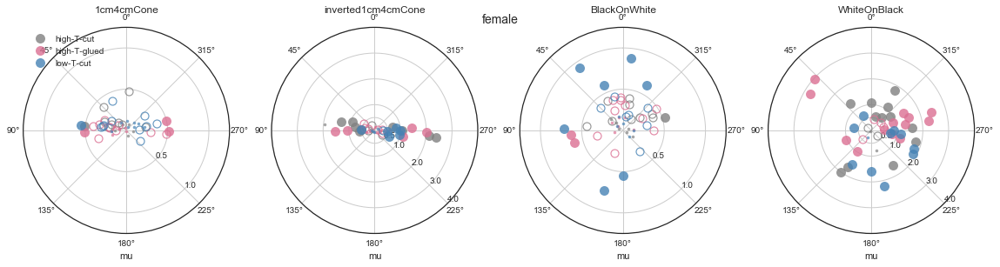

In [104]:
sceneYLim = [1.25,4,1.25,4]
groupCol = [['black','mediumpurple','blue'],
            ['grey','palevioletred','steelblue']]
for si, sex in enumerate(["male","female"]):
    
    fixFig = plt.figure(figsize=(16,4))
    fixFig.suptitle(sex,fontsize=14)

    for scene, sceneName in enumerate(sceneNames):
        
        for groupid, group in enumerate(fitdata_df.group.cat.categories.tolist()):
            #polar plot of fitted location and shape parameter - unimodal
            ax = fixFig.add_subplot(1,4,scene+1, projection='polar')

            notgof_df = fitdata_df.query('sceneName == "'+sceneName+'" & sex == "'+sex+
                                         '" & group == "'+group+'" & gof == 0')
            if not notgof_df.empty:
                notgof_df.plot(ax=ax, x="mu", y="kappa", color=groupCol[si][groupid], marker='.',
                                alpha=0.7, linestyle='none', grid=True, label='_nolegend_')
            
            gof_df = fitdata_df.query('sceneName == "'+sceneName+'" & sex == "'+sex+
                                      '" & group == "'+group+'" & gof == 1 & kappa < '+str(kappaTH))
            if not gof_df.empty:
                gof_df.plot(ax=ax, x="mu", y="kappa", markeredgecolor=groupCol[si][groupid], marker='o',
                            alpha=0.8, markerfacecolor='none',  markeredgewidth=1.2, markersize = 9,
                            linestyle='none',grid=True, label='_nolegend_')
            
            fix_df = fitdata_df.query('sceneName == "'+sceneName+'" & sex == "'+sex+
                                      '" & group == "'+group+'" & gof == 1 & kappa >= '+str(kappaTH))
            if not fix_df.empty:
                fix_df.plot(ax=ax, x="mu", y="kappa", color=groupCol[si][groupid], marker='o',
                            markersize = 11, alpha=0.8, linestyle='none', grid=True)
                            # c = slct_df["group"].cat.codes, colormap='Accent',
            
            #slct = np.logical_and(vmfits[scene,1,:]>kappaTH,goodFit)
            
            ax.set_title(sceneName)
            ax.set_rlabel_position(225)
            ax.set_yticks([0.5, 1, 2, 3, 4])
            ax.set_ylim(0, sceneYLim[scene])
            ax.set_theta_zero_location("N")
            
        if(scene<1):
            ax.legend(fitdata_df.group.cat.categories.tolist(),loc=2)
        else:
            ax.legend('')
        
    fixFig.tight_layout()
    fixFig.savefig(sep.join(analysisDir.split(sep)[:-5]) + '/' + groupFile + '_' + sex
                   + '_uniModalFixation.pdf', format='pdf') 

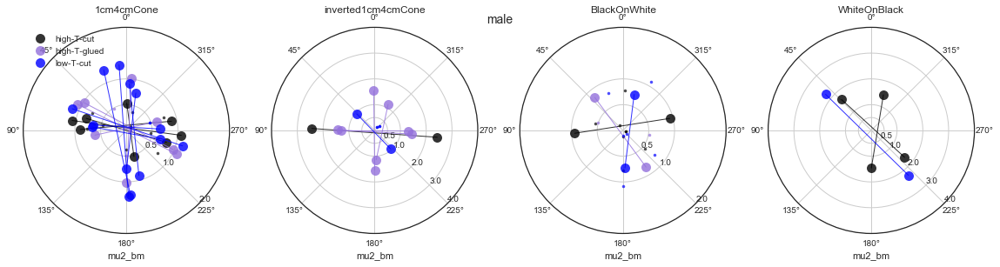

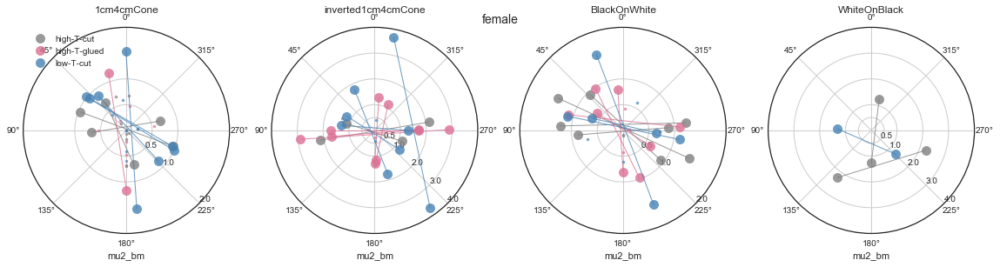

In [103]:
sceneYLim = [2,4,2,4]
groupCol = [['black','mediumpurple','blue'],
            ['grey','palevioletred','steelblue']]
for si, sex in enumerate(["male","female"]):
    
    fixFig = plt.figure(figsize=(16,4))
    fixFig.suptitle(sex,fontsize=14)

    for scene, sceneName in enumerate(sceneNames):
        
        for groupid, group in enumerate(fitdata_df.group.cat.categories.tolist()):
            #polar plot of fitted location and shape parameter - unimodal
            ax = fixFig.add_subplot(1,4,scene+1, projection='polar')

            notgof_df = fitdata_df.query('sceneName == "'+sceneName+'" & sex == "'+sex+
                                         '" & group == "'+group+'" & gof_bm == 0')
            if not notgof_df.empty:
                notgof_df.plot(ax=ax, x="mu1_bm", y="kappa_bm", color=groupCol[si][groupid], marker='.',
                                alpha=0.7, linestyle='none', grid=True, label='_nolegend_')
                notgof_df.plot(ax=ax, x="mu2_bm", y="kappa_bm", color=groupCol[si][groupid], marker='.',
                                alpha=0.7, linestyle='none', grid=True, label='_nolegend_')
            
            gof_df = fitdata_df.query('sceneName == "'+sceneName+'" & sex == "'+sex+
                                      '" & group == "'+group+'" & gof_bm == 1 & kappa_bm < '+str(kappaTH))
            if not gof_df.empty:
                gof_df.plot(ax=ax, x="mu1_bm", y="kappa_bm", markeredgecolor=groupCol[si][groupid], marker='o',
                            alpha=0.8, markerfacecolor='none',  markeredgewidth=1.2, markersize = 9,
                            linestyle='none',grid=True, label='_nolegend_')
                gof_df.plot(ax=ax, x="mu2_bm", y="kappa_bm", markeredgecolor=groupCol[si][groupid], marker='o',
                            alpha=0.8, markerfacecolor='none',  markeredgewidth=1.2, markersize = 9,
                            linestyle='none',grid=True, label='_nolegend_')
            
            fix_df = fitdata_df.query('sceneName == "'+sceneName+'" & sex == "'+sex+
                                      '" & group == "'+group+'" & gof_bm == 1 & kappa_bm >= '+str(kappaTH))
            if not fix_df.empty:
                try:
                    x = [fix_df["mu1_bm"].values, fix_df["mu2_bm"].values]
                    y = [fix_df["kappa_bm"].values, fix_df["kappa_bm"].values]
                    ax.plot(x,y,alpha=0.8, color=groupCol[si][groupid], linewidth=1,label='_nolegend_')
                except KeyError:
                    print("KeyError " + group)
                    print(x)
                    
                
                fix_df.plot(ax=ax, x="mu1_bm", y="kappa_bm", color=groupCol[si][groupid], marker='o',
                            markersize = 11, alpha=0.8, linestyle='none', grid=True,label='_nolegend_')
                fix_df.plot(ax=ax, x="mu2_bm", y="kappa_bm", color=groupCol[si][groupid], marker='o',
                            markersize = 11, alpha=0.8, linestyle='none', grid=True)
                
        if(scene<1):
            ax.legend(fitdata_df.group.cat.categories.tolist(),loc=2)
        else:
            ax.legend('')
        ax.set_title(sceneName)
        ax.set_rlabel_position(225)
        ax.set_yticks([0.5, 1, 2, 3, 4])
        ax.set_ylim(0, sceneYLim[scene])
        ax.set_theta_zero_location("N")
        
    fixFig.tight_layout()
    fixFig.savefig(sep.join(analysisDir.split(sep)[:-5]) + '/' + groupFile + '_' + sex
                   + '_biModalFixation.pdf', format='pdf') 

### By genotype analysis

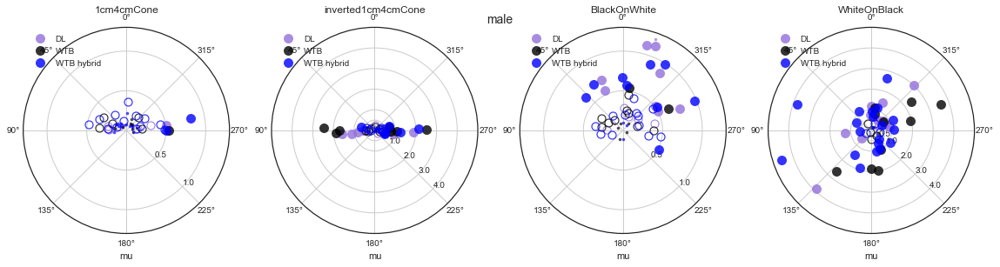

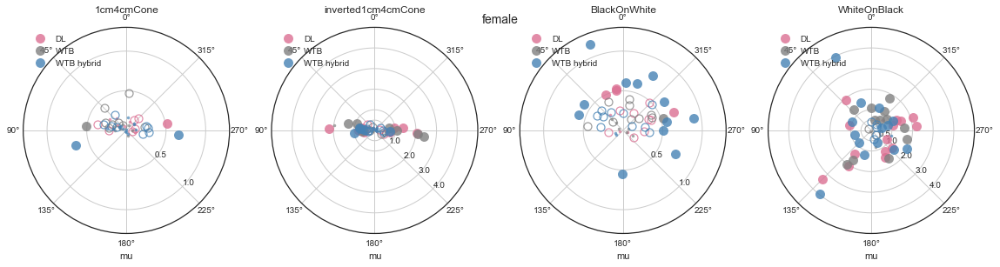

In [93]:
sceneYLim = [1.3,5,1.3,5]
groupCol = [['mediumpurple','black','blue'],
            ['palevioletred','grey','steelblue']]
for si, sex in enumerate(["male","female"]):
    
    fixFig = plt.figure(figsize=(16,4))
    fixFig.suptitle(sex,fontsize=14)

    for scene, sceneName in enumerate(sceneNames):
        
        for groupid, group in enumerate(fitdata_df.genotype.cat.categories.tolist()):
            #polar plot of fitted location and shape parameter - unimodal
            ax = fixFig.add_subplot(1,4,scene+1, projection='polar')

            notgof_df = fitdata_df.query('sceneName == "'+sceneName+'" & sex == "'+sex+
                                         '" & genotype == "'+group+'" & gof == 0')
            if not notgof_df.empty:
                notgof_df.plot(ax=ax, x="mu", y="kappa", color=groupCol[si][groupid], marker='.',
                                alpha=0.7, linestyle='none', grid=True, label='_nolegend_')
            
            gof_df = fitdata_df.query('sceneName == "'+sceneName+'" & sex == "'+sex+
                                      '" & genotype == "'+group+'" & gof == 1 & kappa < '+str(kappaTH))
            if not gof_df.empty:
                gof_df.plot(ax=ax, x="mu", y="kappa", markeredgecolor=groupCol[si][groupid], marker='o',
                            alpha=0.8, markerfacecolor='none',  markeredgewidth=1.2, markersize = 9,
                            linestyle='none',grid=True, label='_nolegend_')
            
            fix_df = fitdata_df.query('sceneName == "'+sceneName+'" & sex == "'+sex+
                                      '" & genotype == "'+group+'" & gof == 1 & kappa >= '+str(kappaTH))
            if not fix_df.empty:
                fix_df.plot(ax=ax, x="mu", y="kappa", color=groupCol[si][groupid], marker='o',
                            markersize = 11, alpha=0.8, linestyle='none', grid=True)
                            # c = slct_df["group"].cat.codes, colormap='Accent',
            
            #slct = np.logical_and(vmfits[scene,1,:]>kappaTH,goodFit)
            
            ax.set_title(sceneName)
            ax.set_rlabel_position(225)
            ax.set_yticks([0.5, 1, 2, 3, 4])
            ax.set_ylim(0, sceneYLim[scene])
            ax.set_theta_zero_location("N")
            
        ax.legend(fitdata_df.genotype.cat.categories.tolist(),loc=2)
        
    fixFig.tight_layout()
    fixFig.savefig(sep.join(analysisDir.split(sep)[:-5]) + '/' + groupFile + '_' + sex
                   + '_uniModalFixation.pdf', format='pdf') 

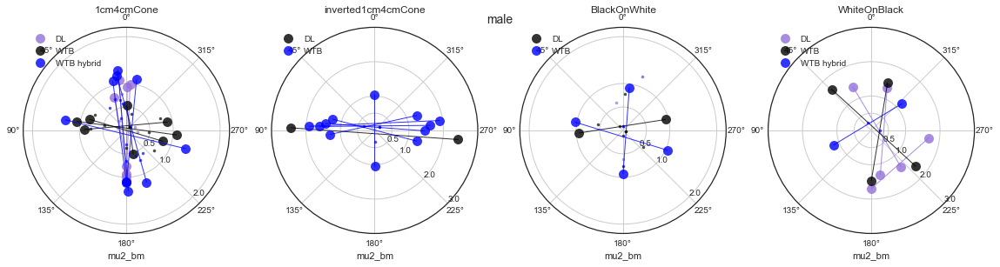

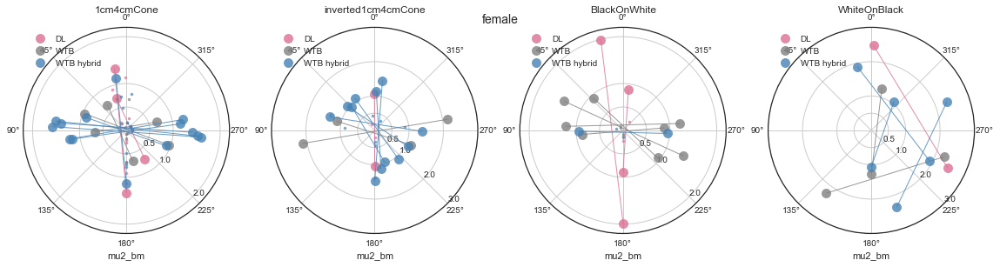

In [94]:
sceneYLim = [2.2,3,2.2,3]

for si, sex in enumerate(["male","female"]):
    
    fixFig = plt.figure(figsize=(16,4))
    fixFig.suptitle(sex,fontsize=14)

    for scene, sceneName in enumerate(sceneNames):
        
        for groupid, group in enumerate(fitdata_df.genotype.cat.categories.tolist()):
            #polar plot of fitted location and shape parameter - unimodal
            ax = fixFig.add_subplot(1,4,scene+1, projection='polar')

            notgof_df = fitdata_df.query('sceneName == "'+sceneName+'" & sex == "'+sex+
                                         '" & genotype == "'+group+'" & gof_bm == 0')
            if not notgof_df.empty:
                notgof_df.plot(ax=ax, x="mu1_bm", y="kappa_bm", color=groupCol[si][groupid], marker='.',
                                alpha=0.7, linestyle='none', grid=True, label='_nolegend_')
                notgof_df.plot(ax=ax, x="mu2_bm", y="kappa_bm", color=groupCol[si][groupid], marker='.',
                                alpha=0.7, linestyle='none', grid=True, label='_nolegend_')
            
            gof_df = fitdata_df.query('sceneName == "'+sceneName+'" & sex == "'+sex+
                                      '" & genotype == "'+group+'" & gof_bm == 1 & kappa_bm < '+str(kappaTH))
            if not gof_df.empty:
                gof_df.plot(ax=ax, x="mu1_bm", y="kappa_bm", markeredgecolor=groupCol[si][groupid], marker='o',
                            alpha=0.8, markerfacecolor='none',  markeredgewidth=1.2, markersize = 9,
                            linestyle='none',grid=True, label='_nolegend_')
                gof_df.plot(ax=ax, x="mu2_bm", y="kappa_bm", markeredgecolor=groupCol[si][groupid], marker='o',
                            alpha=0.8, markerfacecolor='none',  markeredgewidth=1.2, markersize = 9,
                            linestyle='none',grid=True, label='_nolegend_')
            
            fix_df = fitdata_df.query('sceneName == "'+sceneName+'" & sex == "'+sex+
                                      '" & genotype == "'+group+'" & gof_bm == 1 & kappa_bm >= '+str(kappaTH))
            if not fix_df.empty:
                try:
                    x = [fix_df["mu1_bm"].values, fix_df["mu2_bm"].values]
                    y = [fix_df["kappa_bm"].values, fix_df["kappa_bm"].values]
                    ax.plot(x,y,alpha=0.8, color=groupCol[si][groupid], linewidth=1,label='_nolegend_')
                except KeyError:
                    print("KeyError " + group)
                    print(x)
                    
                
                fix_df.plot(ax=ax, x="mu1_bm", y="kappa_bm", color=groupCol[si][groupid], marker='o',
                            markersize = 11, alpha=0.8, linestyle='none', grid=True,label='_nolegend_')
                fix_df.plot(ax=ax, x="mu2_bm", y="kappa_bm", color=groupCol[si][groupid], marker='o',
                            markersize = 11, alpha=0.8, linestyle='none', grid=True)
                
        ax.legend(fitdata_df.genotype.cat.categories.tolist(),loc=2)
        ax.set_title(sceneName)
        ax.set_rlabel_position(225)
        ax.set_yticks([0.5, 1, 2, 3, 4])
        ax.set_ylim(0, sceneYLim[scene])
        ax.set_theta_zero_location("N")
        
    fixFig.tight_layout()
    fixFig.savefig(sep.join(analysisDir.split(sep)[:-5]) + '/' + groupFile + '_' + sex
                   + '_biModalFixation.pdf', format='pdf') 

### Visualisation with ggplot and R magic

In [94]:
fitdata_df

,genotype,group,wings,room temp,sex,scene,contrast,sceneName,trialType,flyID,mu,kappa,gof,mu1_bm,mu2_bm,kappa_bm,gof_bm
0,WTB,high-T-cut,cut,high,male,1D,darkOnBright,BlackOnWhite,1,1,-1.560,0.3870,1,NaN,NaN,NaN,0
1,WTB,high-T-cut,cut,high,male,1D,darkOnBright,BlackOnWhite,1,2,0.340,0.0932,0,-0.0539,-3.140,0.7710,0
2,WTB,high-T-cut,cut,high,male,1D,darkOnBright,BlackOnWhite,1,3,-0.159,0.4560,1,NaN,NaN,NaN,0
3,WTB,high-T-cut,cut,high,male,1D,darkOnBright,BlackOnWhite,1,4,2.750,0.1170,0,1.3400,-2.250,0.5550,0
4,WTB,high-T-cut,cut,high,male,1D,darkOnBright,BlackOnWhite,1,5,0.671,0.1730,1,NaN,NaN,NaN,0
5,WTB,high-T-cut,cut,high,male,1D,darkOnBright,BlackOnWhite,1,6,1.410,0.2730,1,NaN,NaN,NaN,0
6,WTB,high-T-cut,cut,high,male,1D,darkOnBright,BlackOnWhite,1,7,-0.302,0.2300,1,NaN,NaN,NaN,0
7,WTB,high-T-cut,cut,high,male,1D,darkOnBright,BlackOnWhite,1,8,1.060,0.2050,1,NaN,NaN,NaN,0
8,WTB,high-T-cut,cut,high,male,1D,darkOnBright,BlackOnWhite,1,9,-0.658,0.1090,0,1.6300,-1.320,0.9370,1
9,WTB,high-T-cut,cut,high,male,1D,darkOnBright,BlackOnWhite,1,10,1.060,0.3060,1,NaN,NaN,NaN,0


In [95]:
# enable R Kernel 
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


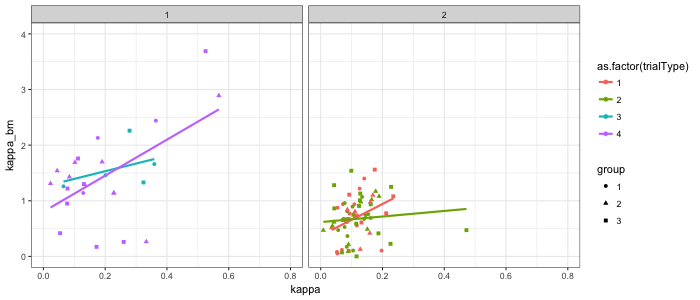

In [154]:
%%R -i fitdata_df -w 700 -h 300 -u px

library(ggplot2)

x <- ggplot(fitdata_df, aes(x=kappa, y=kappa_bm, color=as.factor(trialType))) + 
     geom_point(aes(shape=group)) + geom_smooth(method=lm,se=FALSE,fullrange=FALSE) +
     facet_grid(. ~ contrast) +
     xlim(0, 0.8) + ylim(0, 4) + theme_bw()
print(x)

for (trial in c(1,2,3,4)){
    scene1dat_df <- subset(fitdata_df, trialType==trial)

    lmfit <- lm(kappa_bm ~ kappa, data = scene1dat_df)
    summary(lmfit)
}

In [150]:
%%R -i fitdata_df -w 700 -h 300 -u px

trial <- 4
scene1dat_df <- subset(fitdata_df, trialType==trial)

lmfit <- lm(kappa_bm ~ kappa, data = scene1dat_df)
s <- capture.output(summary(lmfit))

In [151]:
#trial 4
a =%R s
for line in a:
    print(line)


Call:
lm(formula = kappa_bm ~ kappa, data = scene1dat_df)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.20954 -0.36133 -0.07142  0.32933  2.17342 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)   1.3157     0.2195   5.995 7.32e-06 ***
kappa         0.3826     0.4563   0.838    0.412    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.8491 on 20 degrees of freedom
  (100 observations deleted due to missingness)
Multiple R-squared:  0.03396,	Adjusted R-squared:  -0.01434 
F-statistic: 0.703 on 1 and 20 DF,  p-value: 0.4117



In [149]:
#trial 3
a =%R s
for line in a:
    print(line)


Call:
lm(formula = kappa_bm ~ kappa, data = scene1dat_df)

Residuals:
      37       39      101      105      205      309 
-0.07709 -0.06651 -0.11404 -0.01721  0.62940 -0.35455 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)   
(Intercept)   1.2961     0.2681   4.835  0.00843 **
kappa         1.1989     0.6526   1.837  0.14009   
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3693 on 4 degrees of freedom
  (116 observations deleted due to missingness)
Multiple R-squared:  0.4576,	Adjusted R-squared:  0.322 
F-statistic: 3.375 on 1 and 4 DF,  p-value: 0.1401



In [147]:
#trial 2
a =%R s
for line in a:
    print(line)


Call:
lm(formula = kappa_bm ~ kappa, data = scene1dat_df)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.67433 -0.24898  0.00762  0.26743  0.87346 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)   0.6170     0.1085   5.687 1.21e-06 ***
kappa         0.5007     0.7748   0.646    0.522    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3727 on 41 degrees of freedom
  (79 observations deleted due to missingness)
Multiple R-squared:  0.01008,	Adjusted R-squared:  -0.01406 
F-statistic: 0.4176 on 1 and 41 DF,  p-value: 0.5217



In [145]:
#trial 1
a =%R s
for line in a:
    print(line)


Call:
lm(formula = kappa_bm ~ kappa, data = scene1dat_df)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.82825 -0.25246  0.03179  0.24791  0.68912 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)  
(Intercept)   0.3748     0.1912    1.96   0.0608 .
kappa         2.8350     1.5078    1.88   0.0713 .
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3934 on 26 degrees of freedom
  (94 observations deleted due to missingness)
Multiple R-squared:  0.1197,	Adjusted R-squared:  0.08583 
F-statistic: 3.535 on 1 and 26 DF,  p-value: 0.07133



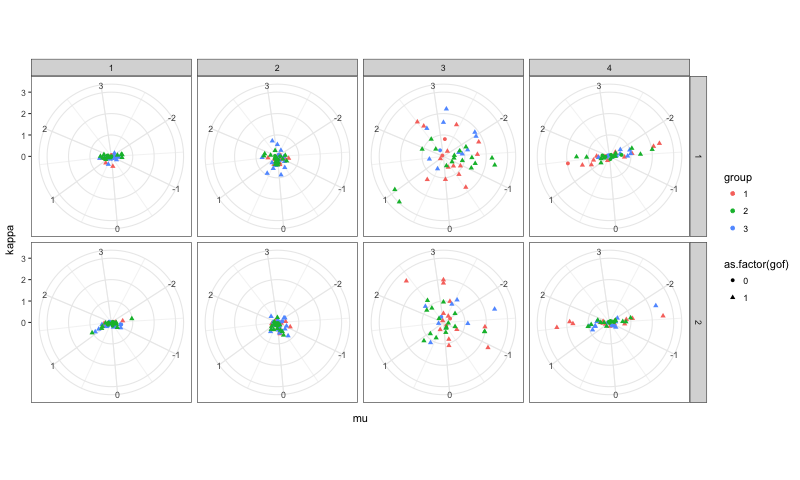

In [96]:
%%R -i fitdata_df -w 800 -h 480 -u px

library(ggplot2)

x <- ggplot(fitdata_df, aes(x=mu, y=kappa, color=group, shape=as.factor(gof))) + geom_point() + coord_polar() + facet_grid(sex ~ sceneName)
x <- x + ylim(0, 3) + theme_bw()
print(x)

In [ ]:
%%R -i fitdata_df -w 800 -h 400 -u px

y <- ggplot(fitdata_df, aes(x=mu, y=mu1_bm, color=group)) + geom_point() + facet_grid(sex ~ sceneName)
y <- y + theme_bw()
print(y)